# **Italian Region Competitiveness Analysis**

**Competitiveness**, as defined by the OECD, **is a nation's ability to produce goods and services that compete internationally while increasing its population's real income over time**. The European Commission uses the **Regional Competitiveness Index (RCI)** to evaluate and compare regional competitiveness within EU Member States.

Italy's regional diversity presents unique challenges and opportunities. This analysis **investigates the RCI indicators to identify key factors affecting regional competitiveness in Italy**. It includes a **global clustering** analysis to group regions based on competitiveness levels **and** compares this with **subgroup analyses** to reveal any significant regional differences.

# **DATASET PRESENTATION AND PRELIMINARY ANALYSIS**

Here is possible to find the folder with the necessary materials to reproduce the code: https://drive.google.com/drive/folders/178SREoVB8Vdvuq0evd8yC7hTYk9IYuu8?usp=sharing 

In [ ]:
import pandas as pd
import openpyxl
import geopandas as gpd
import matplotlib.pyplot as plt

In [ ]:
# Import Data
RCI22_data = pd.read_excel('Regional competitiveness - RCI 2022.xlsx', sheet_name=1)

In [ ]:
# Visualize data headers
RCI22_data.head()

,NUTS,Region name,Corruption,Quality and accountability,Impartiality,Individuals who used the internet for interaction with public authorities,Presence of corruption in the national public institutions in the country,Presence of corruption in the local or regional public institutions in the country,Ease of doing business,Property rights,...,Total patent applications,Core creative class employment,Knowledge workers,Scientific publications,Total intramural research and development expenditure,Human Resources in Science and Technology,Employment in technology and knowledge-intensive sectors,Trademark applications,Design applications,Sales of new-to-market and new-to-firms innovation
0,AT_C,Vienna and its commuting zone,0.576955,0.564817,1.119228,81.659248,0.62,0.62,78.74549,6.171304,...,185.781523,12.379769,33.297939,2.110594,2.955385,55.156199,6.056480,185.350638,101.167919,93.866455
1,AT11,Burgenland,0.606000,0.770000,1.010000,77.000000,0.62,0.62,78.74549,6.171304,...,29.053571,9.215173,30.618573,0.073220,0.864611,49.800000,2.771699,185.350638,101.167919,93.866455
2,AT21,Kärnten,0.576000,0.510000,1.073000,75.000000,0.62,0.62,78.74549,6.171304,...,148.740638,9.357711,28.150861,0.605774,3.214407,50.000000,5.283605,145.245253,140.535449,108.873203
3,AT22,Steiermark,0.540000,0.657000,1.501000,77.000000,0.62,0.62,78.74549,6.171304,...,240.143549,10.654637,29.232307,2.113984,5.150101,46.700000,3.554740,145.245253,140.535449,108.873203
4,AT31,Oberösterreich,0.609000,0.549000,1.288000,76.000000,0.62,0.62,78.74549,6.171304,...,313.771748,9.693907,30.854632,0.792423,3.490870,48.000000,3.434558,186.639684,194.812193,112.586758


In [ ]:
# Filter only italian region
RCI22_data_IT = RCI22_data[RCI22_data['NUTS'].str.contains('IT')]
RCI22_data_IT

,NUTS,Region name,Corruption,Quality and accountability,Impartiality,Individuals who used the internet for interaction with public authorities,Presence of corruption in the national public institutions in the country,Presence of corruption in the local or regional public institutions in the country,Ease of doing business,Property rights,...,Total patent applications,Core creative class employment,Knowledge workers,Scientific publications,Total intramural research and development expenditure,Human Resources in Science and Technology,Employment in technology and knowledge-intensive sectors,Trademark applications,Design applications,Sales of new-to-market and new-to-firms innovation
151,ITC1,Piemonte,-0.547,-0.360,-0.943,43.0,0.83,0.82,72.85055,4.379064,...,97.615061,7.848631,24.524217,1.223565,2.265999,37.1,3.944897,97.618789,97.504055,128.381933
152,ITC2,Valle d’Aosta/Vallée d’Aoste,-0.900,-0.073,-0.902,45.0,0.83,0.82,72.85055,4.379064,...,59.453032,8.403402,21.673166,0.259627,0.484466,32.1,NaN,38.583680,116.025957,128.381933
153,ITC3,Liguria,-0.629,-0.611,-0.947,40.0,0.83,0.82,72.85055,4.379064,...,51.791977,8.532550,23.687971,1.550535,1.493122,36.9,3.133469,71.579904,50.483855,128.381933
154,ITC4,Lombardia,-1.035,-0.336,-1.356,43.0,0.83,0.82,72.85055,4.379064,...,135.694656,8.612542,26.614370,1.407724,1.333240,39.2,5.541533,154.689261,148.086801,128.381933
155,ITF1,Abruzzo,-1.084,-1.152,-1.395,40.0,0.83,0.82,72.85055,4.379064,...,35.339902,7.363135,20.730352,1.335557,1.066058,37.9,3.002692,82.076202,92.339044,128.381933
156,ITF2,Molise,-1.057,-1.469,-1.398,40.0,0.83,0.82,72.85055,4.379064,...,23.393504,6.208920,18.767866,0.933496,1.176380,33.9,2.002002,55.327323,23.365057,128.381933
157,ITF3,Campania,-1.978,-2.252,-1.714,31.0,0.83,0.82,72.85055,4.379064,...,12.844628,5.863225,13.798939,1.242222,1.309123,30.5,2.820448,92.695974,77.165833,128.381933
158,ITF4,Puglia,-1.213,-1.500,-1.560,33.0,0.83,0.82,72.85055,4.379064,...,11.704338,5.138656,13.984767,0.819134,0.802834,28.9,2.066733,73.731990,108.884351,128.381933
159,ITF5,Basilicata,-1.279,-1.474,-1.802,36.0,0.83,0.82,72.85055,4.379064,...,8.440693,5.950080,16.676033,0.719350,0.626585,33.1,2.118644,38.241344,78.121731,128.381933
160,ITF6,Calabria,-1.702,-2.255,-2.325,32.0,0.83,0.82,72.85055,4.379064,...,8.970451,5.387355,12.922218,0.842700,0.564933,28.9,1.576620,39.813169,38.283969,128.381933


Download from the official **European Commission** website, in the section dedicated to the [regional competitiveness](‘https://ec.europa.eu/regional_policy/assets/regional-competitiveness/index.html#/’) of EU member states, the [Excel file](‘https://ec.europa.eu/regional_policy/sources/work/rci_2022/RCI_2_0_scores_2022_2019_2016.xlsx’) containing data related to the **RCI 2.0** index calculated for the years 2016, 2019, and 2022, as well as the scores associated with the Pillars, to specifically analyze the case of Italy.

In [ ]:
# Import Data with RCI 2.0 Scores and Pillars' Scores
RCI22_index = pd.read_excel('RCI_2_0_scores_2022_2019_2016.xlsx', sheet_name='RCI 2.0 - 2022 regional')
RCI22_index.head()

,REGION NAME,NUTS code,Stage of development,Rank,RCI 2.0 - 2022,Basic Sub-index,Institutions Pillar,Macroeconomic Pillar,Infrastructure Pillar,Health Pillar,Basic education Pillar,Efficiency Sub-Index,Higher education and LLL Pillar,Labour Market Efficiency Pillar,Market Size Pillar,Innovation Sub-Index,Technological readiness Pillar,Business sophistication Pillar,Innovation Pillar
0,Utrecht,NL31,MD,1,151.1,138.1,161.6,146.9,171.6,114.8,114.0,157.4,143.0,119.3,264.6,156.1,158.4,155.0,154.1
1,Zuid-Holland,NL33,MD,2,142.5,136.5,162.9,146.9,160.9,114.4,114.0,146.4,130.7,117.0,237.3,145.8,155.9,143.0,135.4
2,Ile-de-France,FR10,MD,3,142.0,120.9,117.0,91.3,185.8,115.8,108.2,152.7,132.1,112.7,274.6,145.1,121.5,172.6,147.0
3,Noord-Brabant,NL41,MD,4,140.6,135.5,163.1,146.9,168.3,105.3,114.0,141.7,124.5,119.7,219.1,148.7,154.9,139.7,150.0
4,Amsterdam and its commuting zone,NL_C,MD,4,140.6,134.1,159.0,146.9,153.6,112.1,114.0,138.4,133.3,117.6,191.9,156.1,156.7,163.4,147.5


In [ ]:
# Filter Italian regions and sort by 'RCI 2.0 - 2022' in descending order
RCI22_IT = RCI22_index[RCI22_index['NUTS code'].str.contains('IT')].sort_values('RCI 2.0 - 2022', ascending=False)

# Reset index and create a 'Regional Rank' column
RCI22_IT = RCI22_IT.reset_index()
RCI22_IT['Regional Rank'] = RCI22_IT.index + 1

# Drop the old index column
RCI22_IT = RCI22_IT.drop(columns='index')

Let’s visualize a map of Italy to gain a clearer understanding of the distribution of the RCI 2.0 index for 2022 across its regions. By examining this map, it is possible to better observe how the index values are spread geographically, allowing for a more detailed analysis of regional competitiveness throughout the country.

To plot the map of Italy and accurately observe the distribution of the RCI 2.0 index for 2022 across its regions, it is necessary to download the geographical reference data. The required data can be obtained from the Istat website via the following link: [Istat Administrative Boundaries](https://www.istat.it/notizia/confini-delle-unita-amministrative-a-fini-statistici-al-1-gennaio-2018-2/). Ensure that the **2024 version** is downloaded, as it contains the updated geographical references essential for creating an accurate map of Italy.

In [ ]:
# Load the GeoDataFrame containing European boundaries, including Italy
shapefile_path = "Limiti01012024_g/Reg01012024_g/Reg01012024_g_WGS84.shp"
# Read the shapefile into a GeoDataFrame
italy = gpd.read_file(shapefile_path)
# Select relevant columns: region name, shape length, shape area, and geometry
italy = italy[['DEN_REG', 'Shape_Leng', 'Shape_Area', 'geometry']]

In [ ]:
# Function to plot a map
def plot_map(obj, title, dim=(8,8)):
    # Create the map with specified dimensions
    fig, ax = plt.subplots(figsize=dim)
    # Plot only the boundaries of the GeoDataFrame
    obj.boundary.plot(ax=ax, linewidth=1, color='black')
    # Add title and other customizations
    ax.set_title(title, fontsize=15)
    plt.axis('off')
    # Display the map
    plt.show()

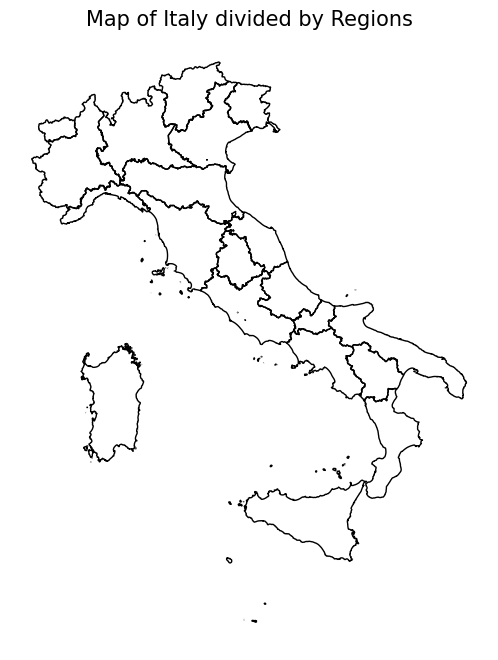

In [ ]:
# Define the title for the map
title_ita = 'Map of Italy divided by Regions'

# Plot the map with the specified title
plot_map(italy, title_ita)

The available data **does not include information** pertaining to the **entire Trentino-Alto Adige region**, but is instead **divided between the autonomous provinces of Trento and Bolzano**. Consequently, it is necessary to customize the existing map by accurately reconstructing the region as comprising its autonomous provinces.

In [ ]:
# Load the GeoDataFrame containing European boundaries, including Italy
shapefile_path = "Limiti01012024_g/ProvCM01012024_g/ProvCM01012024_g_WGS84.shp"

# Read the shapefile into a GeoDataFrame
prov = gpd.read_file(shapefile_path)

In [ ]:
# Extract autonomous provinces from the GeoDataFrame
# Filter for 'Bolzano' and 'Trento' in the 'DEN_UTS' column
prov_sub = prov[prov.DEN_UTS.isin(['Bolzano', 'Trento'])]
# Check boundaries of the Trentino-Alto Adige region
# Filter the 'italy' GeoDataFrame for the region 'Trentino-Alto Adige'
trentino = italy[italy.DEN_REG == 'Trentino-Alto Adige']

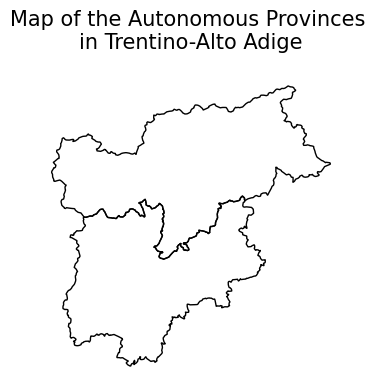

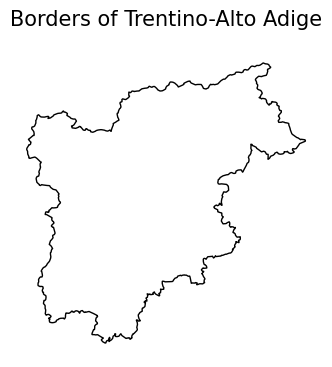

In [ ]:
# Plot the map of the autonomous provinces in Trentino-Alto Adige
plot_map(prov_sub, 'Map of the Autonomous Provinces \nin Trentino-Alto Adige', dim=(4,4))
# Plot the map showing the borders of the Trentino-Alto Adige region
plot_map(trentino, 'Borders of Trentino-Alto Adige', dim=(4,4))

It is proposed to replace the Trentino-Alto Adige region with the two autonomous provinces of Trento and Bolzano. Therefore, it is necessary to update the map to accurately reflect this subdivision by representing the region through its distinct autonomous provinces.

In [ ]:
# Select relevant columns from the filtered GeoDataFrame of autonomous provinces
# Keep columns: province name, shape length, shape area, and geometry
prov_sub = prov_sub[['DEN_PROV', 'Shape_Leng', 'Shape_Area', 'geometry']]

# Rename 'DEN_PROV' column to 'DEN_REG' for consistency with other datasets
prov_sub = prov_sub.rename(columns={'DEN_PROV': 'DEN_REG'})

In [ ]:
# Concatenate the original Italy GeoDataFrame with the filtered autonomous provinces
# Combine them into a new GeoDataFrame
new_ita = pd.concat([italy, prov_sub], axis=0)

# Remove the 'Trentino-Alto Adige' region from the combined GeoDataFrame
new_ita = new_ita[new_ita['DEN_REG'] != 'Trentino-Alto Adige']

# Reset the index of the GeoDataFrame and drop the old index column
new_ita = new_ita.reset_index().drop('index', axis=1)

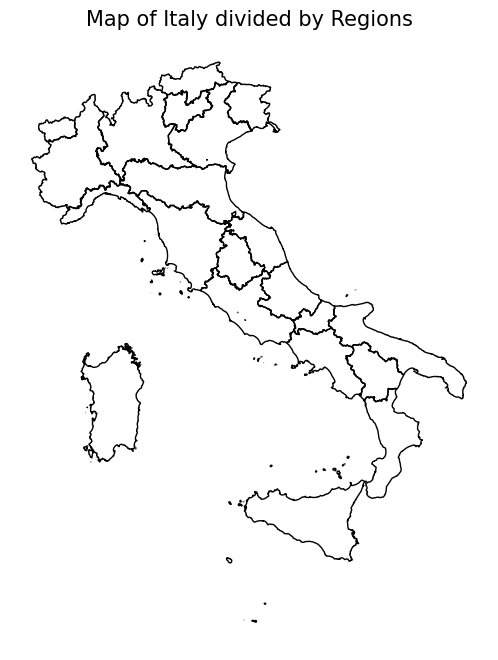

In [ ]:
# Plot the personalized map of Italy divided by regions, including the updated GeoDataFrame
plot_map(new_ita, 'Map of Italy divided by Regions')

It is necessary to proceed with the correct renaming of some regions because, as indicated later, not all regional names are consistent between the index dataset `RCI22_IT` and that one necessary to plot the geographical map, `new_ita`. To harmonize two lists of similar but not exactly identical items, fuzzy matching techniques can be applied. Fuzzy matching allows for **comparing two strings based on their similarity, rather than exact match**.

In [ ]:
# Create a sorted list of region names from the RCI22_IT DataFrame
lista_RCI = list(RCI22_IT['REGION NAME'].sort_values())

# Create a sorted list of region names from the new_ita GeoDataFrame
lista_ita = list(new_ita['DEN_REG'].sort_values())

# Check for regions present in lista_RCI but not in lista_ita
for regione in range(len(lista_RCI)):
    if lista_RCI[regione] not in lista_ita:
        print(lista_RCI[regione])  # Print regions missing in lista_ita

# Check for regions present in lista_ita but not in lista_RCI
for regione in range(len(lista_ita)):
    if lista_ita[regione] not in lista_RCI:
        print(lista_ita[regione])  # Print regions missing in lista_RCI

Prov. Autonoma di Bolzano/Bozen
Prov. Autonoma di Trento
Valle d’Aosta/Vallée d’Aoste
Bolzano
Trento
Valle d'Aosta


In [ ]:
pip install rapidfuzz

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


An "automatic" technique is then implemented to ensure correct standardization of the names through `rapidfuzz`.

In [ ]:
from rapidfuzz import process

# Function to find the closest matches between two lists
def uniforma_lista(lista1, lista2):
    lista_uniformata = []
    for item in lista1:
        # Find the most similar item from lista2 for each item in lista1
        match = process.extractOne(item, lista2)
        # Append the best match to the new list
        lista_uniformata.append(match[0])
    return lista_uniformata

# Create a uniform list based on the values in lista_RCI
lista_uniformata = uniforma_lista(lista_ita, lista_RCI)
# Sort the uniform list
lista_uniformata.sort()

# Print the uniform list
print("Lista Uniformata:")
print(lista_uniformata)

Lista Uniformata:
['Abruzzo', 'Basilicata', 'Calabria', 'Campania', 'Emilia-Romagna', 'Friuli-Venezia Giulia', 'Lazio', 'Liguria', 'Lombardia', 'Marche', 'Molise', 'Piemonte', 'Prov. Autonoma di Bolzano/Bozen', 'Prov. Autonoma di Trento', 'Puglia', 'Sardegna', 'Sicilia', 'Toscana', 'Umbria', 'Valle d’Aosta/Vallée d’Aoste', 'Veneto']


In [ ]:
# Check if the uniform list is equal to lista_RCI
if lista_uniformata == lista_RCI:
    print("The uniform list matches lista_RCI.")
else:
    print("The uniform list does not match lista_RCI.")

The uniform list matches lista_RCI.


Therefore, the function is applied directly to the column of the dataset named `new_ita`.

In [ ]:
# Update the 'DEN_REG' column in new_ita by applying the uniforma_lista function
# The function matches each region name in new_ita['DEN_REG'] to the closest value in lista_RCI
new_ita['DEN_REG'] = uniforma_lista(new_ita['DEN_REG'], lista_RCI)

# Display the updated GeoDataFrame
new_ita

,DEN_REG,Shape_Leng,Shape_Area,geometry
0,Piemonte,1.234644e+06,2.539164e+10,"POLYGON ((457749.464 5145501.795, 458662.395 5..."
1,Valle d’Aosta/Vallée d’Aoste,3.111871e+05,3.258608e+09,"POLYGON ((390652.643 5091766.17, 390748.643 50..."
2,Lombardia,1.411360e+06,2.386287e+10,"MULTIPOLYGON (((485536.498 4985444.636, 485366..."
3,Veneto,1.056504e+06,1.835149e+10,"POLYGON ((768135.209 5175357.497, 768136.788 5..."
4,Friuli-Venezia Giulia,6.593411e+05,7.936834e+09,"MULTIPOLYGON (((871036.678 5066768.855, 871032..."
5,Liguria,8.219165e+05,5.417714e+09,"MULTIPOLYGON (((568227.844 4874810.869, 568220..."
6,Emilia-Romagna,1.176992e+06,2.250182e+10,"MULTIPOLYGON (((618343.929 4893985.66, 618335...."
7,Toscana,1.304650e+06,2.298501e+10,"MULTIPOLYGON (((674479.64 4680664.861, 674610...."
8,Umbria,6.194046e+05,8.463969e+09,"MULTIPOLYGON (((776982.135 4832209.841, 776910..."
9,Marche,6.188483e+05,9.344543e+09,"POLYGON ((802366.734 4874989.456, 803616.974 4..."


At this point, the map is colored based on the **RCI 2.0 - 2022** values.

In [ ]:
# Select relevant columns from the RCI22_IT DataFrame
# These columns include region names, NUTS codes, ranks, and RCI 2.0 index values
RCI22_IT_sub = RCI22_IT[['REGION NAME', 'NUTS code', 'Rank', 'RCI 2.0 - 2022']]

# Merge the new_ita GeoDataFrame with RCI22_IT_sub based on matching region names
# 'DEN_REG' in new_ita corresponds to 'REGION NAME' in RCI22_IT_sub
choropleth_italy = new_ita.merge(RCI22_IT_sub, left_on='DEN_REG', right_on='REGION NAME')

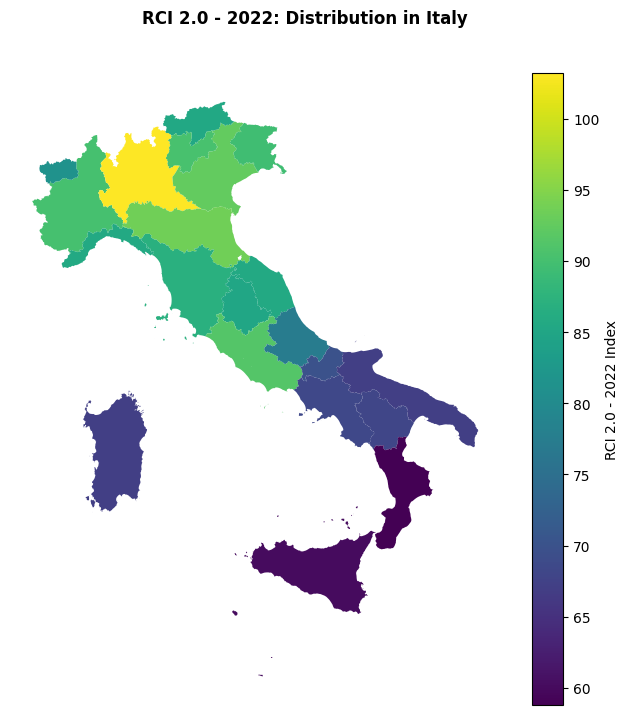

In [ ]:
# Plot the choropleth map for the 'RCI 2.0 - 2022' index
# Use the 'viridis' colormap and show the legend
choroplet = choropleth_italy.plot(column='RCI 2.0 - 2022', cmap='viridis', legend=True, figsize=(8,8))

# Get the current figure and axis
fig = plt.gcf()  # Get the current figure
ax = plt.gca()   # Get the current axis

# Add a title to the colorbar (legend)
cbar = choroplet.get_figure().get_axes()[1]  # The legend axis is usually at index 1
cbar.set_ylabel('RCI 2.0 - 2022 Index')    # Set the label for the colorbar

# Remove the axis from the map for better visualization
ax.axis('off')

# Adjust the figure's layout to increase the top margin for the title
fig.subplots_adjust(top=0.9)  # Increase the top margin to accommodate the title

# Set the title for the entire figure, centered and formatted
fig.suptitle('RCI 2.0 - 2022: Distribution in Italy', fontweight='bold', fontsize=12)

# Display the map
plt.show()

In [ ]:
# Print the maximum and minimum values of the 'RCI 2.0 - 2022' index
print('RCI max: ', RCI22_IT_sub['RCI 2.0 - 2022'].max(), ', RCI min: ', RCI22_IT_sub['RCI 2.0 - 2022'].min())

RCI max:  103.2 , RCI min:  58.8


For a more interactive version of the same map, the `folium` library can be used as follows.

In [ ]:
import folium

# Create a map centered on Italy with a starting zoom level
mappa = folium.Map(location=[41.8719, 12.5674], zoom_start=6)

# Add a Choropleth layer to the map with regions colored based on the RCI 2.0 index
folium.Choropleth(
    geo_data=choropleth_italy,  # GeoDataFrame with geographical data
    data=choropleth_italy,      # DataFrame with RCI 2.0 index values
    columns=['REGION NAME', 'RCI 2.0 - 2022'],  # Columns to use for mapping
    key_on='feature.properties.REGION NAME',      # Key to match GeoJSON properties with data
    fill_color='Purples',        # Color scheme for the regions
    fill_opacity=0.7,            # Opacity of the region colors
    line_opacity=0.2,            # Opacity of the boundary lines
    legend_name='RCI 2.0 - 2022'  # Title for the legend
).add_to(mappa)

# Add a GeoJson layer with tooltips showing region names and RCI 2.0 index values
folium.GeoJson(
    choropleth_italy,
    name='Regioni',  # Name of the layer
    style_function=lambda feature: {
        'fillColor': '#ffffff00',  # Transparent fill color to keep the Choropleth color
        'color': 'black',          # Color of the boundaries
        'weight': 0.5,             # Thickness of the boundaries
        'fillOpacity': 0           # Make fill transparent
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['REGION NAME', 'RCI 2.0 - 2022'],  # Fields to display in tooltips
        aliases=['Regione:', 'RCI 2022:'],         # Text to display before values
        localize=True
    )
).add_to(mappa)

# Display the map
mappa

/Users/sara/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


Given the significant disparity between Lombardy and the other regions, it may be useful to temporarily exclude Lombardy from the analyses. This would allow for a more detailed examination of the remaining regions, thus removing a clear *outlier*.

In [ ]:
# Remove Lombardia
choro_no_lombardy = choropleth_italy[choropleth_italy.DEN_REG != 'Lombardia'].reset_index().drop('index', axis=1)

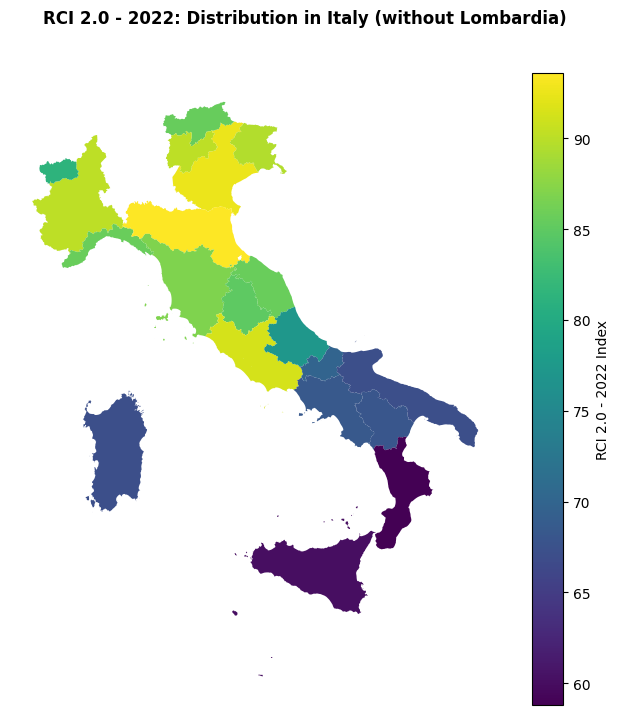

In [ ]:
# Plot the choropleth map for the 'RCI 2.0 - 2022' index excluding Lombardia
# Use the 'viridis' colormap and show the legend
choroplet_no_lomb = choro_no_lombardy.plot(column='RCI 2.0 - 2022', cmap='viridis', legend=True, figsize=(8,8))

# Get the current figure and axis
fig = plt.gcf()  # Get the current figure
ax = plt.gca()   # Get the current axis

# Add a title to the colorbar (legend)
cbar_nolomb = choroplet_no_lomb.get_figure().get_axes()[1]  # The legend axis is typically at index 1
cbar_nolomb.set_ylabel('RCI 2.0 - 2022 Index')  # Set the label for the colorbar

# Remove the axis from the map for a cleaner appearance
ax.axis('off')

# Adjust the figure layout to increase the top margin for the title
fig.subplots_adjust(top=0.9)  # Increase the top margin to fit the title

# Set the title for the entire figure, centered and formatted
fig.suptitle('RCI 2.0 - 2022: Distribution in Italy (without Lombardia)', fontweight='bold', fontsize=12)

# Display the map
plt.show()

This approach allows for a clearer observation of the differences within the regions highlighted in green, which were previously less perceptible. Furthermore, the southern areas display more pronounced differences.

Given the evident difference between northern-central Italy and southern Italy, proceed with the separate visualization of Northern and Central Italy compared to Southern Italy and the Islands, in order to detect differences between the two emerging groups.

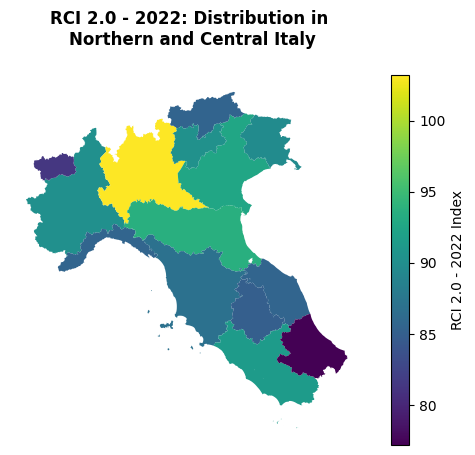

In [ ]:
# Filter data for regions with an RCI 2.0 - 2022 score of 75 or higher (Northern and Central Italy)
choro_nord = choropleth_italy[choropleth_italy['RCI 2.0 - 2022'] >= 75].reset_index().drop('index', axis=1)

# Create the choropleth map for the filtered data
choroplet_nord = choro_nord.plot(column='RCI 2.0 - 2022', cmap='viridis', legend=True, figsize=(7,5))

# Get the current figure and axis
fig = plt.gcf()  # Get the current figure
ax = plt.gca()   # Get the current axis

# Add a title to the colorbar (legend)
cbar_nord = choroplet_nord.get_figure().get_axes()[1]  # The colorbar is typically at index 1
cbar_nord.set_ylabel('RCI 2.0 - 2022 Index')  # Set the label for the colorbar

# Remove the axis for a cleaner map appearance
ax.axis('off')

# Adjust the figure layout to increase the top margin for the title
fig.subplots_adjust(top=0.85)  # Adjust the top margin to fit the title properly

# Set the title for the figure, centered and formatted
fig.suptitle('RCI 2.0 - 2022: Distribution in \nNorthern and Central Italy', fontweight='bold', fontsize=12)

# Display the map
plt.show()

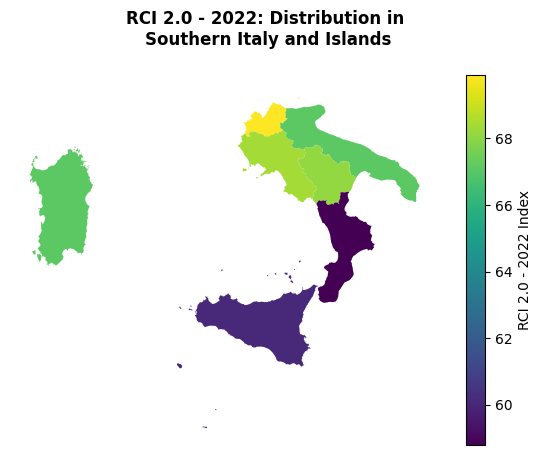

In [ ]:
# Filter data for regions with an RCI 2.0 - 2022 score below 75 (Southern Italy and Islands)
choro_sud = choropleth_italy[choropleth_italy['RCI 2.0 - 2022'] < 75].reset_index().drop('index', axis=1)

# Create the choropleth map for the filtered data
choroplet_sud = choro_sud.plot(column='RCI 2.0 - 2022', cmap='viridis', legend=True, figsize=(7,5))

# Get the current figure and axis
fig = plt.gcf()  # Get the current figure
ax = plt.gca()   # Get the current axis

# Add a title to the colorbar (legend)
cbar_sud = choroplet_sud.get_figure().get_axes()[1]  # The colorbar is typically at index 1
cbar_sud.set_ylabel('RCI 2.0 - 2022 Index')  # Set the label for the colorbar

# Remove the axis for a cleaner map appearance
ax.axis('off')

# Adjust the figure layout to increase the top margin for the title
fig.subplots_adjust(top=0.85)  # Adjust the top margin to fit the title

# Set the title for the figure, centered and formatted
fig.suptitle('RCI 2.0 - 2022: Distribution in \nSouthern Italy and Islands', fontweight='bold', fontsize=12)

# Display the map
plt.show()

## **TIMESERIES ANALYSIS OF RCI 2.0 OVER 2016, 2019 e 2022**

Proceed with a brief analysis of the index evolution in Italy from 2016 to 2019 and up to 2022, for which the version 2.0 of the RCI index is available. This version allows for a temporal analysis of the changes occurring over the years.

The information about 2022 is already stored in the previously created DataFrame, `RCI22_index`, while, for 2016 and 2019, it's necessary to proceed with the download of the [Excel file's sheets](‘https://ec.europa.eu/regional_policy/sources/work/rci_2022/RCI_2_0_scores_2022_2019_2016.xlsx’).

In [ ]:
# Import Data
RCI19_index = pd.read_excel('RCI_2_0_scores_2022_2019_2016.xlsx', sheet_name='RCI 2.0 - 2019 regional')
RCI16_index = pd.read_excel('RCI_2_0_scores_2022_2019_2016.xlsx', sheet_name='RCI 2.0 - 2016 regional')

A dataset is created to store the RCI information for each region for all three years.

In [ ]:
# Select relevant columns from the RCI dataframes for the years 2016, 2019, and 2022
df16 = RCI16_index[['REGION NAME', 'NUTS code', 'RCI 2.0 - 2016']]
df19 = RCI19_index[['REGION NAME', 'NUTS code', 'RCI 2.0 - 2019']]
df22 = RCI22_index[['REGION NAME', 'NUTS code', 'RCI 2.0 - 2022']]

# Filter df22 to include only rows where the 'NUTS code' contains 'IT' (for Italy)
df22 = df22[df22['NUTS code'].str.contains('IT')].reset_index().drop('index', axis=1)

In [ ]:
# Merge DataFrames on 'REGION NAME' to combine RCI data for the years 2016, 2019, and 2022
serie_storica = df16.merge(df19, on='REGION NAME').merge(df22, on='REGION NAME')

# Drop unwanted columns, which are redundant 'NUTS code' columns from the merged DataFrames
serie_storica = serie_storica.drop(columns=['NUTS code', 'NUTS code_x', 'NUTS code_y'], axis=1)

# Temporarily update region names for labeling in plots
# Use .loc to correctly modify DataFrame values
serie_storica.loc[serie_storica['REGION NAME'] == 'Valle d’Aosta/Vallée d’Aoste', 'REGION NAME'] = 'Valle d’Aosta'
serie_storica.loc[serie_storica['REGION NAME'] == 'Prov. Autonoma di Bolzano/Bozen', 'REGION NAME'] = 'P.A. di Bolzano'
serie_storica.loc[serie_storica['REGION NAME'] == 'Prov. Autonoma di Trento', 'REGION NAME'] = 'P.A. di Trento'

# Display the modified DataFrame
serie_storica

,REGION NAME,RCI 2.0 - 2016,RCI 2.0 - 2019,RCI 2.0 - 2022
0,Piemonte,89.7,90.2,90.1
1,Valle d’Aosta,82.5,78.6,81.3
2,Liguria,87.5,89.0,85.6
3,Lombardia,98.5,101.1,103.2
4,Abruzzo,74.7,79.1,77.2
5,Molise,71.7,73.7,69.9
6,Campania,65.1,71.6,68.4
7,Puglia,62.0,68.6,67.1
8,Basilicata,64.5,70.1,68.1
9,Calabria,58.6,62.5,58.8


Create a heatmap to visualize the RCI 2.0 index values for Italian regions over three different years (2016, 2019, and 2022).

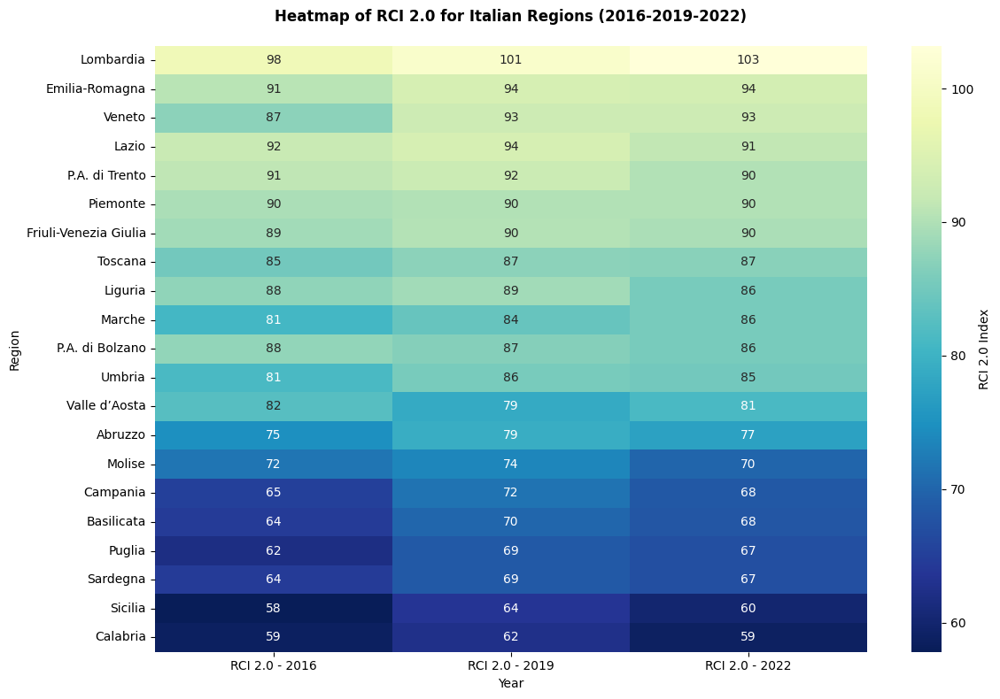

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Transpose the DataFrame to create a matrix suitable for a heatmap
df_heatmap = serie_storica.sort_values(by='RCI 2.0 - 2022', ascending=False).set_index('REGION NAME')
df_heatmap = df_heatmap[['RCI 2.0 - 2016', 'RCI 2.0 - 2019', 'RCI 2.0 - 2022']]

# Create the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(df_heatmap, annot=True, fmt='.0f', cmap='YlGnBu_r', cbar_kws={'label': 'RCI 2.0 Index'})
plt.title('Heatmap of RCI 2.0 for Italian Regions (2016-2019-2022)', fontweight='bold', pad=20)
plt.xlabel('Year')
plt.ylabel('Region')
plt.xticks(rotation=0, ha='center')
plt.tight_layout()
plt.show()

### **GROWTH RATES OVER TIME**

Calculate the percentage changes in the RCI 2.0 index for Italian regions across three periods (2016-2019, 2019-2022, and 2016-2022) and creates bar charts to visualize these changes.

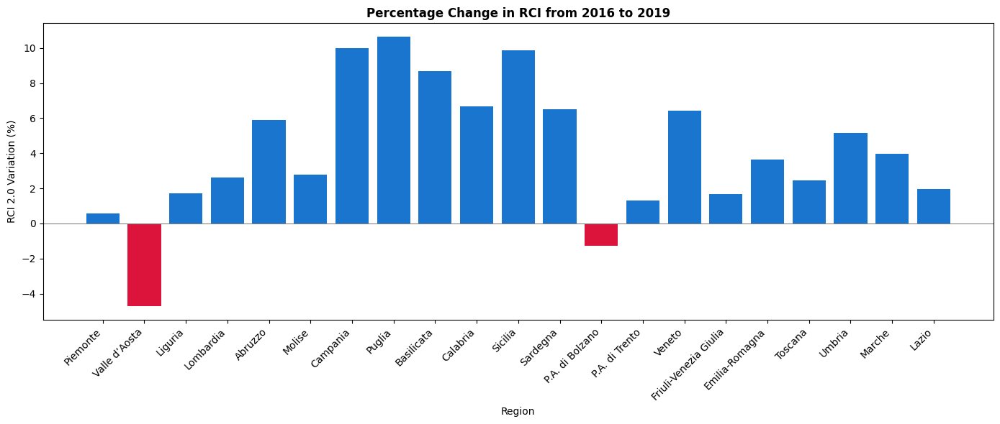

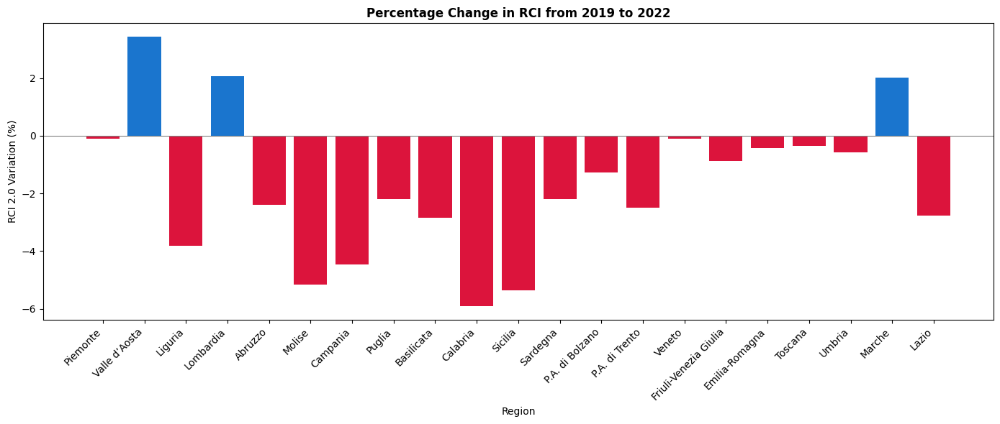

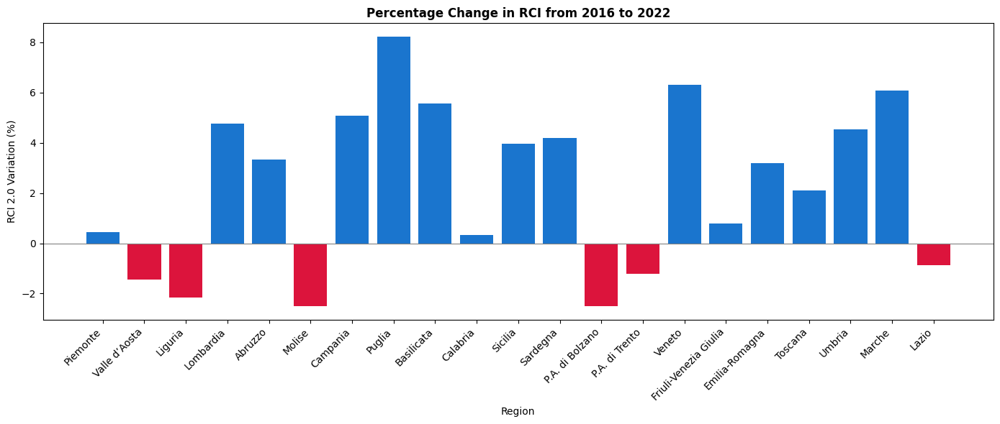

In [ ]:
# Calculate percentage changes
serie_storica['Variazione_2016_2019'] = ((serie_storica['RCI 2.0 - 2019'] - serie_storica['RCI 2.0 - 2016']) / serie_storica['RCI 2.0 - 2016']) * 100
serie_storica['Variazione_2019_2022'] = ((serie_storica['RCI 2.0 - 2022'] - serie_storica['RCI 2.0 - 2019']) / serie_storica['RCI 2.0 - 2019']) * 100
serie_storica['Variazione_2016_2022'] = ((serie_storica['RCI 2.0 - 2022'] - serie_storica['RCI 2.0 - 2016']) / serie_storica['RCI 2.0 - 2016']) * 100

# Colors based on growth (blue) or decline (orange)
color_2016_2019 = ['#1a75ce' if x >= 0 else '#dc143c' for x in serie_storica['Variazione_2016_2019']]
color_2019_2022 = ['#1a75ce' if x >= 0 else '#dc143c' for x in serie_storica['Variazione_2019_2022']]
color_2016_2022 = ['#1a75ce' if x >= 0 else '#dc143c' for x in serie_storica['Variazione_2016_2022']]

# Plot for the variation from 2016 to 2019
plt.figure(figsize=(14, 6))
plt.bar(serie_storica['REGION NAME'], serie_storica['Variazione_2016_2019'], color=color_2016_2019)
plt.title('Percentage Change in RCI from 2016 to 2019', fontweight='bold')
plt.xlabel('Region')
plt.ylabel('RCI 2.0 Variation (%)')
plt.axhline(0, color='grey', linewidth=0.8)  # Reference line for zero change
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Plot for the variation from 2019 to 2022
plt.figure(figsize=(14, 6))
plt.bar(serie_storica['REGION NAME'], serie_storica['Variazione_2019_2022'], color=color_2019_2022)
plt.title('Percentage Change in RCI from 2019 to 2022', fontweight='bold')
plt.xlabel('Region')
plt.ylabel('RCI 2.0 Variation (%)')
plt.axhline(0, color='grey', linewidth=0.8)  # Reference line for zero change
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Plot for the variation from 2016 to 2022
plt.figure(figsize=(14, 6))
plt.bar(serie_storica['REGION NAME'], serie_storica['Variazione_2016_2022'], color=color_2016_2022)
plt.title('Percentage Change in RCI from 2016 to 2022', fontweight='bold')
plt.xlabel('Region')
plt.ylabel('RCI 2.0 Variation (%)')
plt.axhline(0, color='grey', linewidth=0.8)  # Reference line for zero change
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# **DATA PRE-PROCESSING**

In this section, analyses were performed to **prepare the dataset for clustering**. **Some variables were removed** based on criteria such as **coefficient of variation (CV)** and **correlation**. Additionally, **standardization of the dataset** was carried out. To facilitate subsequent analyses, a **wide-format dataset** was created containing all the information on the **retained indices**, along with **sub-datasets**, also in wide format, that divide the indices according to their **Pillar of belonging**. This process reduced the number of indicators **from 68 to 31**.

### **Variable Removal Based on Correlation**

To facilitate the removal of data based on correlation, it was deemed appropriate to include information about the Pillar in the dataset. This allowed for the examination of correlations within each Pillar, which pertains to the macroarea of interest and includes the indices that compose it. By doing so, we could avoid spurious correlations and make more accurate decisions.

First, the initial dataset was transformed from a wide format to a long format, incorporating the information related to the Pillars.

In [ ]:
import pandas as pd

# Load the dataset
RCI22_data_IT_Long = RCI22_data_IT

# Define the pillar and indicator mapping
pillar_map = {
    'Institutions – regional': [
        'Corruption',
        'Quality and accountability',
        'Impartiality',
        'Individuals who used the internet for interaction with public authorities'
    ],
    'Institutions – national': [
        'Presence of corruption in the national public institutions in the country',
        'Presence of corruption in the local or regional public institutions in the country',
        'Ease of doing business',
        'Property rights',
        'Intellectual property protection',
        'Efficiency of legal framework in settling disputes',
        'Efficiency of legal framework in challenging regulations',
        'Organised crime',
        'Reliability of police services',
        'Judicial independence'
    ],
    'Macroeconomic stability': [
        'General government deficit/surplus',
        'National savings',
        'Government bond yields',
        'Government debt',
        'Net international investment position'
    ],
    'Infrastructure': [
        'Road transport performance',
        'Rail transport performance',
        'Accessibility to passenger flights'
    ],
    'Health': [
        'Road fatalities',
        'Healthy life expectancy',
        'Child mortality',
        'Cancer disease death rate (x1000)',
        'Heart disease death rate (x1000)',
        'Suicide death rate'
    ],
    'Basic education': [
        'Low achievement in reading (15-year-olds)',
        'Low achievement in maths (15-year-olds)',
        'Low achievement in science (15-year-olds)'
    ],
    'Higher education and lifelong learning': [
        'Higher educational attainment',
        'Lifelong learning ',
        'Early school leavers',
        'University accessibility',
        'Lower-secondary completion only'
    ],
    'Labour market efficiency': [
        'Employment rate (excluding agriculture)',
        'Long-term unemployment',
        'Unemployment rate',
        'Labour productivity',
        'Gender balance unemployment',
        'Gender balance employment',
        'NEET rate',
        'Labour market slack',
        'Temporary employment'
    ],
    'Market size': [
        'Disposable income per capita',
        'Potential market size expressed in GDP',
        'Potential market size expressed in population'
    ],
    'Technological readiness – regional': [
        'Households with broadband access (%)',
        'Individuals buying over internet the last year',
        'Access to high-speed broadband',
        'Individuals with above-basic overall digital skills'
    ],
    'Technological readiness – national': [
        'Enterprises having received orders online (at least 1\xa0%)',
        'Enterprises with fixed broadband access. '
    ],
    'Business sophistication': [
        'Employment (K-N sectors)',
        'Gross value added (GVA) (K-N sectors)',
        'Innovative SMEs collaborating with others',
        'Marketing or organisational innovators'
    ],
    'Innovation': [
        'Total patent applications',
        'Core creative class employment',
        'Knowledge workers',
        'Scientific publications',
        'Total intramural research and development expenditure ',
        'Human Resources in Science and Technology',
        'Employment in technology and knowledge-intensive sectors ',
        'Trademark applications',
        'Design applications',
        'Sales of new-to-market and new-to-firms innovation'
    ]
}

# Create an empty list to accumulate new data
data = []

# Iterate over each pillar and its indicators
for pillar, indicators in pillar_map.items():
    for indicator in indicators:
        if indicator in RCI22_data_IT_Long.columns:
            # Add each row of the DataFrame with the indicator and pillar
            for index, row in RCI22_data_IT_Long.iterrows():
                data.append({
                    'NUTS': row['NUTS'],
                    'Region name': row['Region name'],
                    'Pillar': pillar,
                    'Indicator': indicator,
                    'Value': row[indicator]
                })

# Create a new DataFrame with the restructured data
RCI22_data_IT_L = pd.DataFrame(data)

# Save the restructured DataFrame to a CSV file
RCI22_data_IT_L.to_csv('RCI22_data_IT_L.csv', index=False)

In [ ]:
RCI22_data_IT_L.shape #(1428, 5) 1428/21 = 68 Indicators

(1428, 5)

*While working with the correlations, it became apparent that some Pillars contained national-level information, as these values did not vary from region to region. Therefore, these Pillars were deemed unnecessary for our analysis and were removed.*

In [ ]:
import pandas as pd

# Calculate the variance for each indicator
variances = RCI22_data_IT_L.groupby('Indicator')['Value'].var()

# Select indicators with variance greater than 0
indicators_with_variance = variances[variances > 0].index

# Filter the dataset to keep only indicators with variance greater than 0
RCI22_data_IT_L_CLEAN = RCI22_data_IT_L[RCI22_data_IT_L['Indicator'].isin(indicators_with_variance)]  # [987 rows x 5 columns]

# Find indicators with variance equal to 0
indicators_variance_zero = variances[variances == 0].index

# Filter the dataset to obtain the 'Pillar' related to indicators with variance equal to 0
pillars_variance_zero = RCI22_data_IT_L[RCI22_data_IT_L['Indicator'].isin(indicators_variance_zero)]

# Count the number of indicators with variance equal to 0 for each Pillar
pillar_counts = pillars_variance_zero.groupby('Pillar')['Indicator'].nunique()

# Filter only Pillars with at least 1 indicator with variance equal to 0
pillar_counts = pillar_counts[pillar_counts > 0].reset_index()

# Display the matrix of Pillars with the number of indicators with variance equal to 0
print(pillar_counts)

                               Pillar  Indicator
0                     Basic education          3
1                          Innovation          1
2             Institutions – national         10
3             Macroeconomic stability          5
4  Technological readiness – national          2


The table above shows the Pillars and the number of indicators within each Pillar that were removed. A total of **4 Pillars**, comprising 20 indicators, were completely removed. Additionally, **1 indicator** was removed from the **Innovation Pillar**. As a result of this process, the number of indicators decreased **from 68 to 47**.


In the subsequent code sections, correlation matrices were created for each Pillar, **removing variables with a correlation greater than 0.9**. After this process, the **number of indicators** was reduced to **40**.


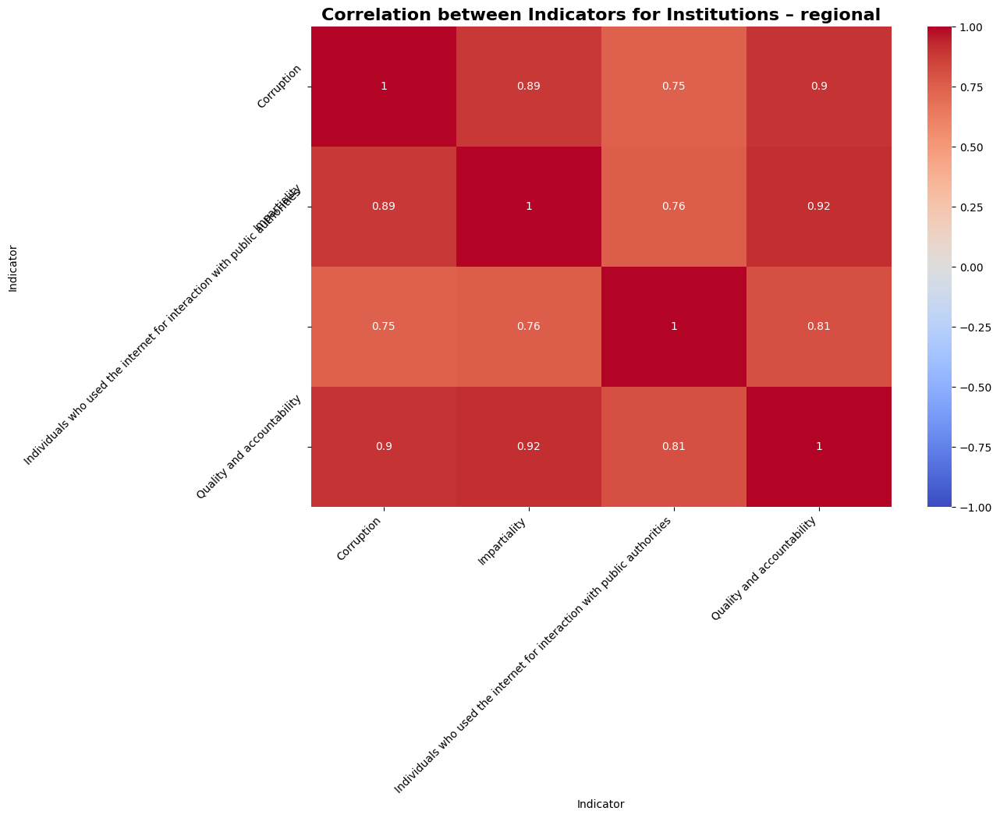

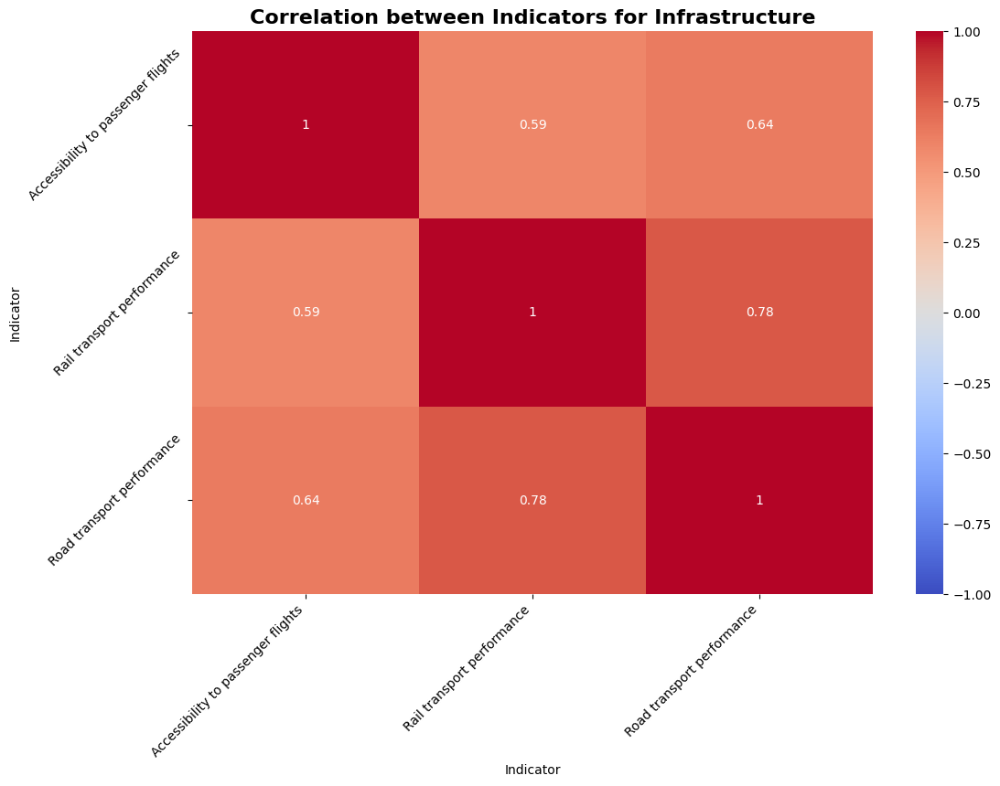

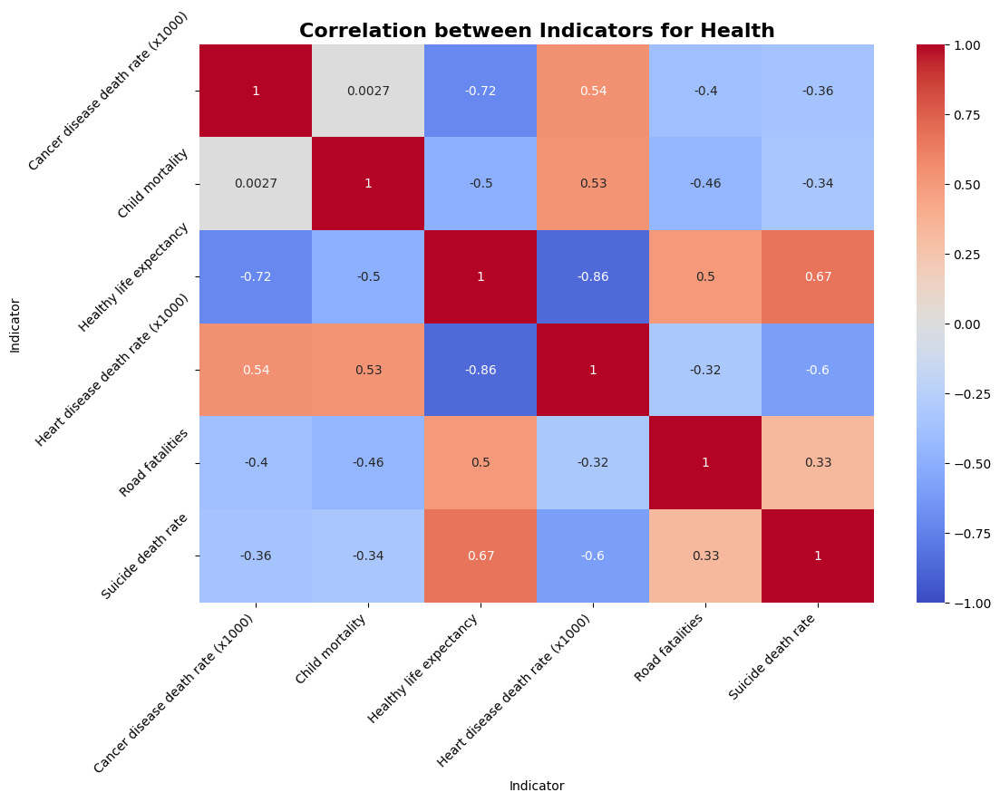

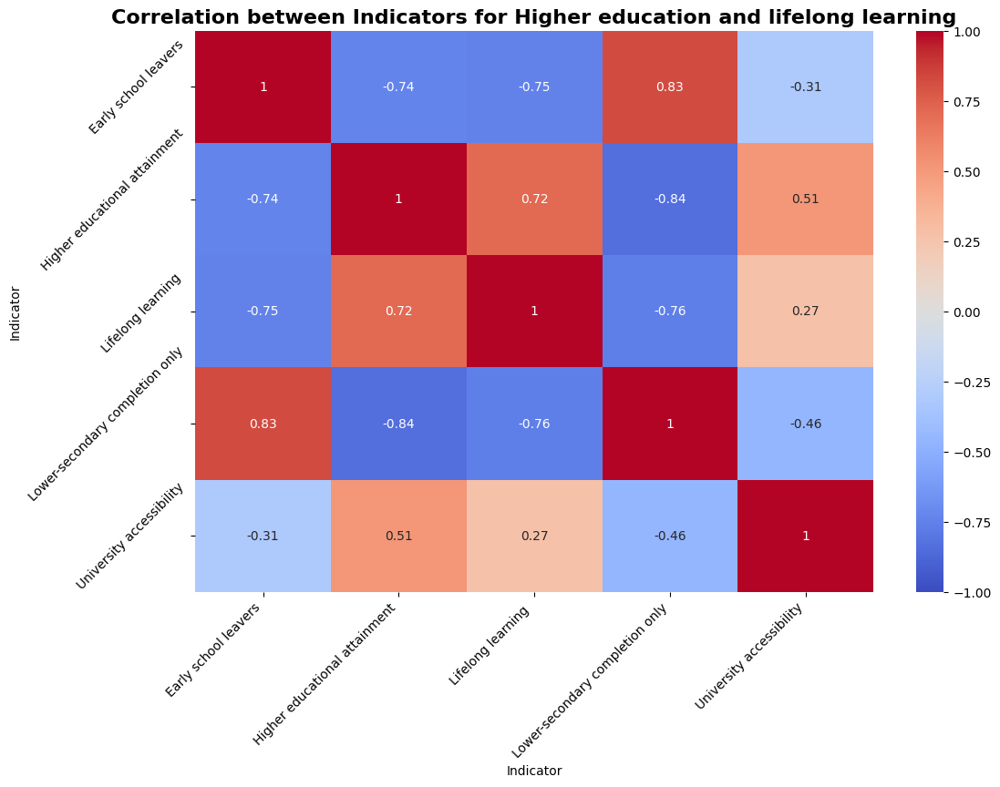

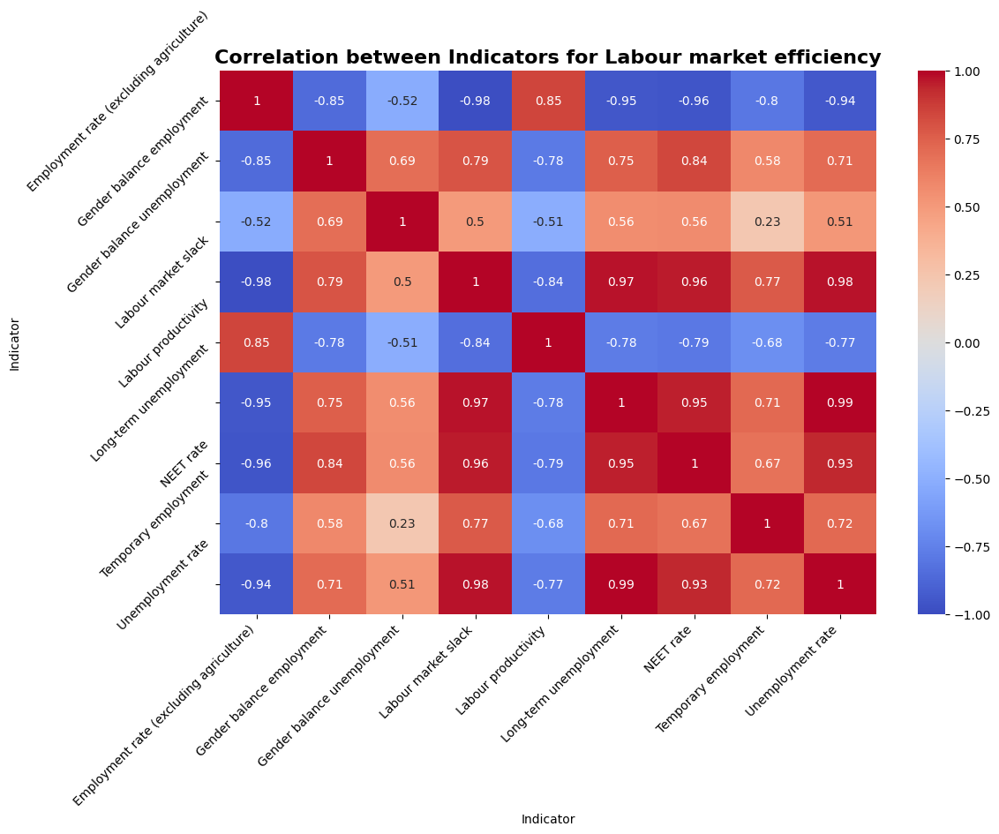

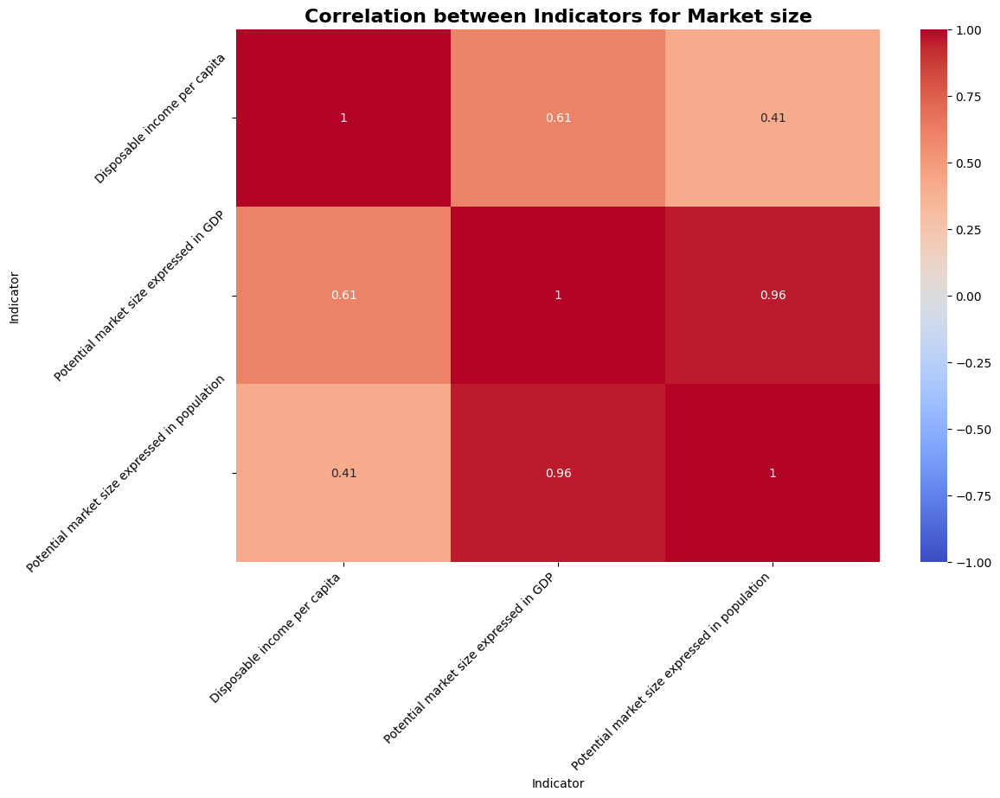

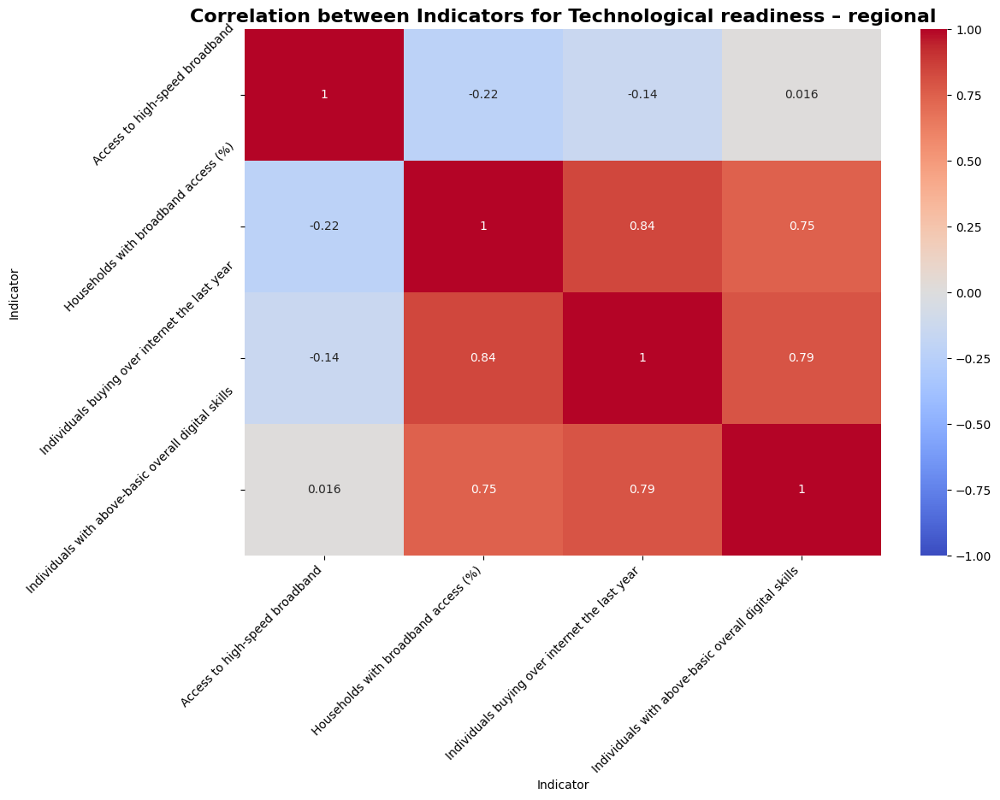

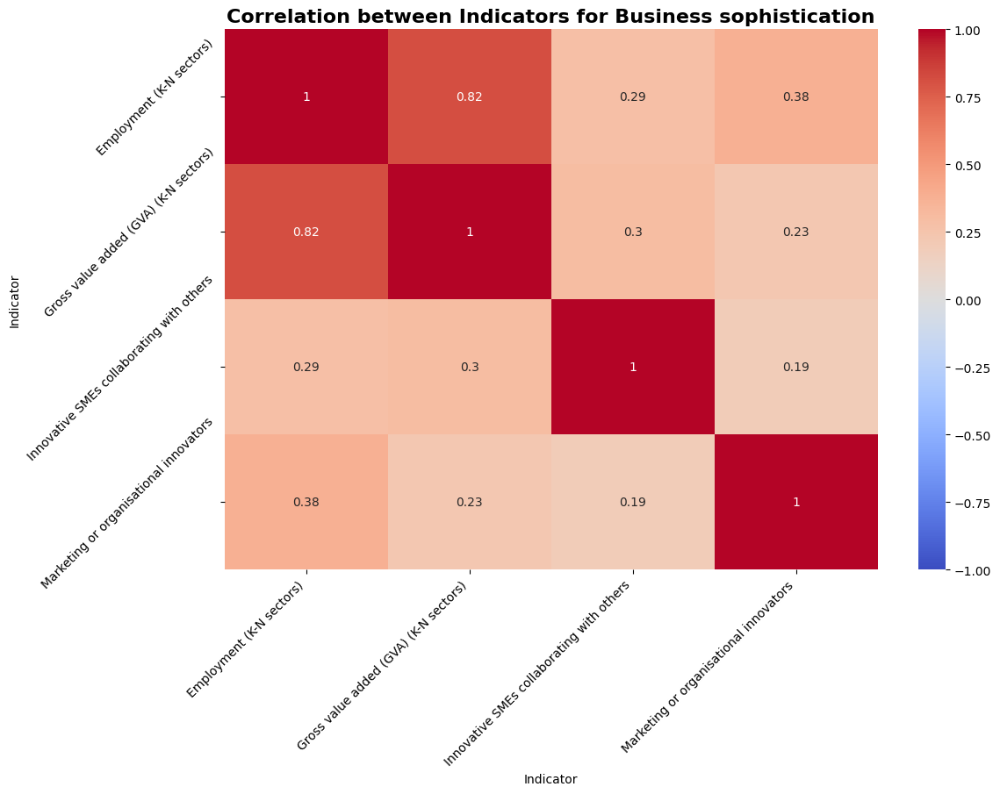

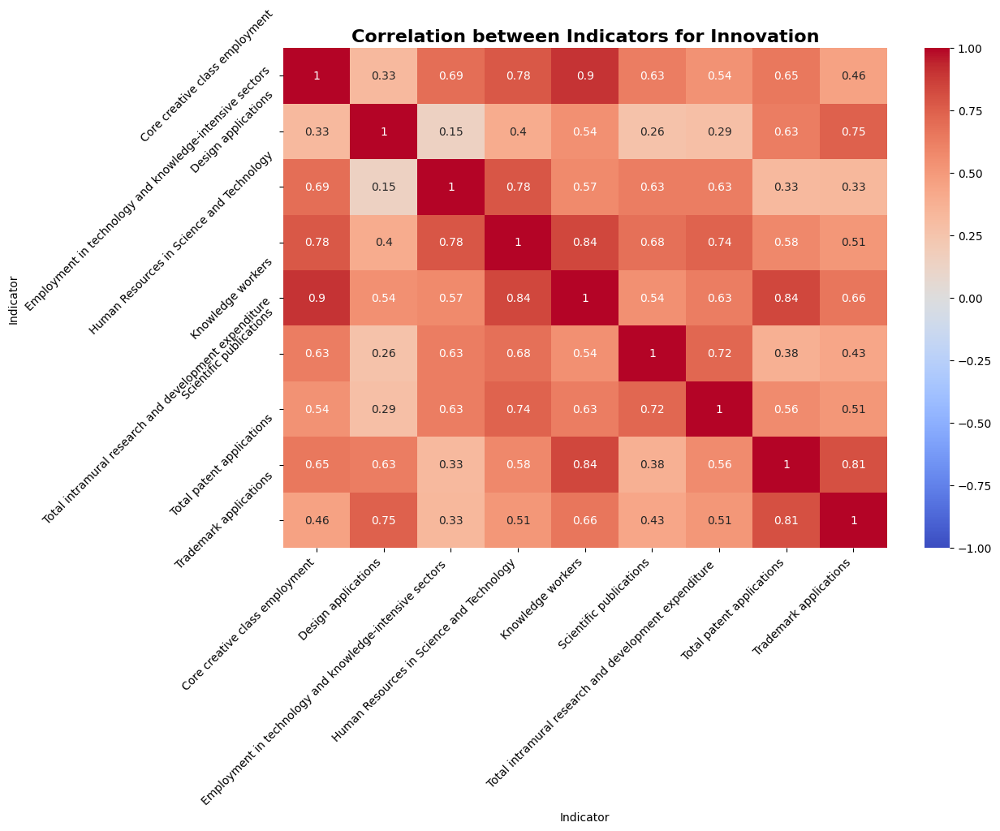

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Get unique Pillar names
pillar_names = RCI22_data_IT_L_CLEAN['Pillar'].unique()

# List to store names of pillars with empty correlation matrices
empty_correlation_pillars = []

# Loop through each Pillar
for pillar_name in pillar_names:
    # Filter the dataset for the current Pillar
    df_pillar = RCI22_data_IT_L_CLEAN[RCI22_data_IT_L_CLEAN['Pillar'] == pillar_name]

    # Create the pivot table for correlation
    df_pivot = df_pillar.pivot(index='Region name', columns='Indicator', values='Value')

    # Calculate the correlation matrix
    correlation_matrix = df_pivot.corr()

    # Visualize the correlation matrix
    plt.figure(figsize=(12, 8))  # Size of the plot
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
    plt.title(f'Correlation between Indicators for {pillar_name}', fontsize=16, weight='bold')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=45)
    plt.show()

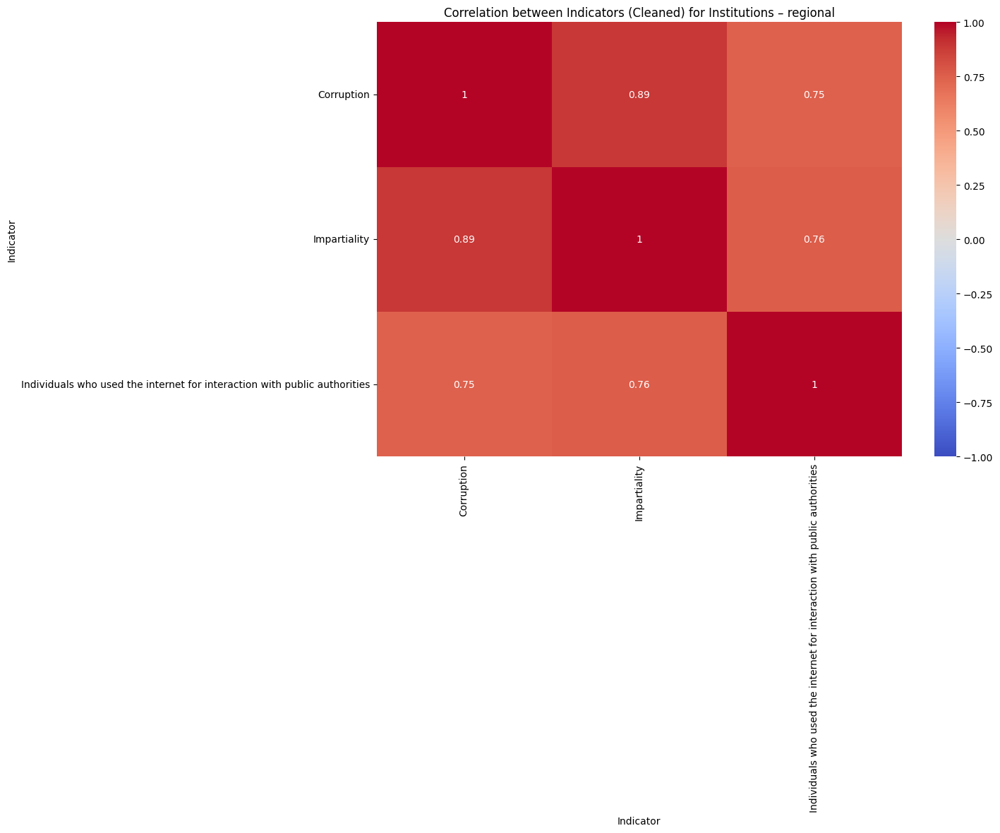

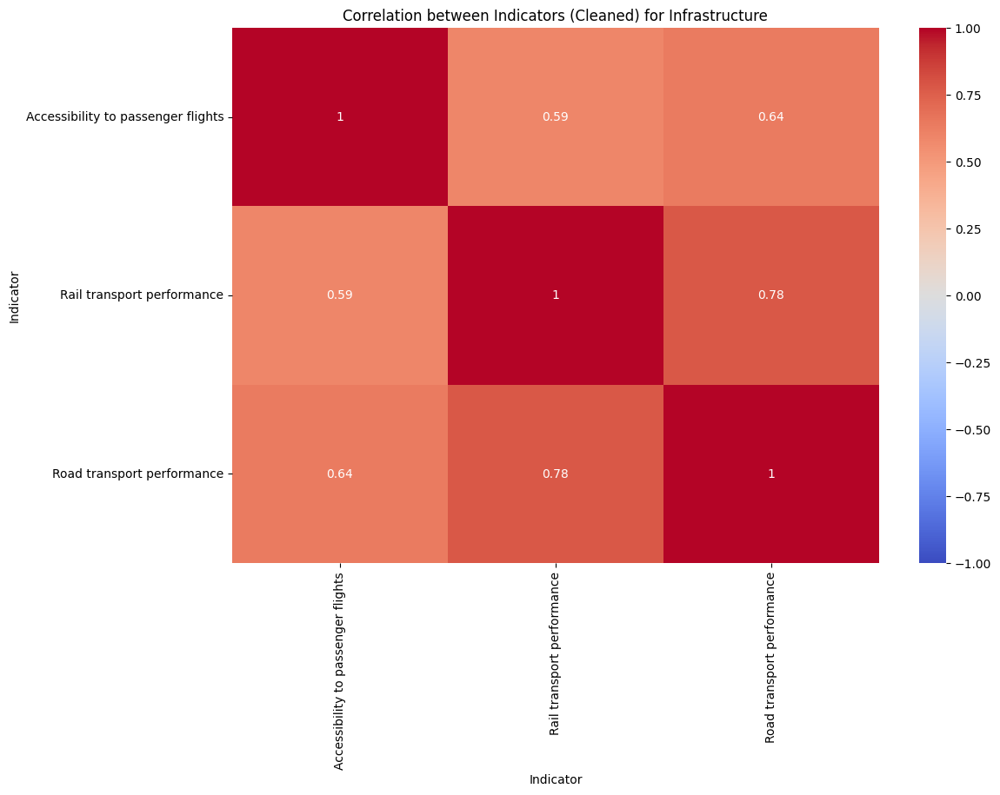

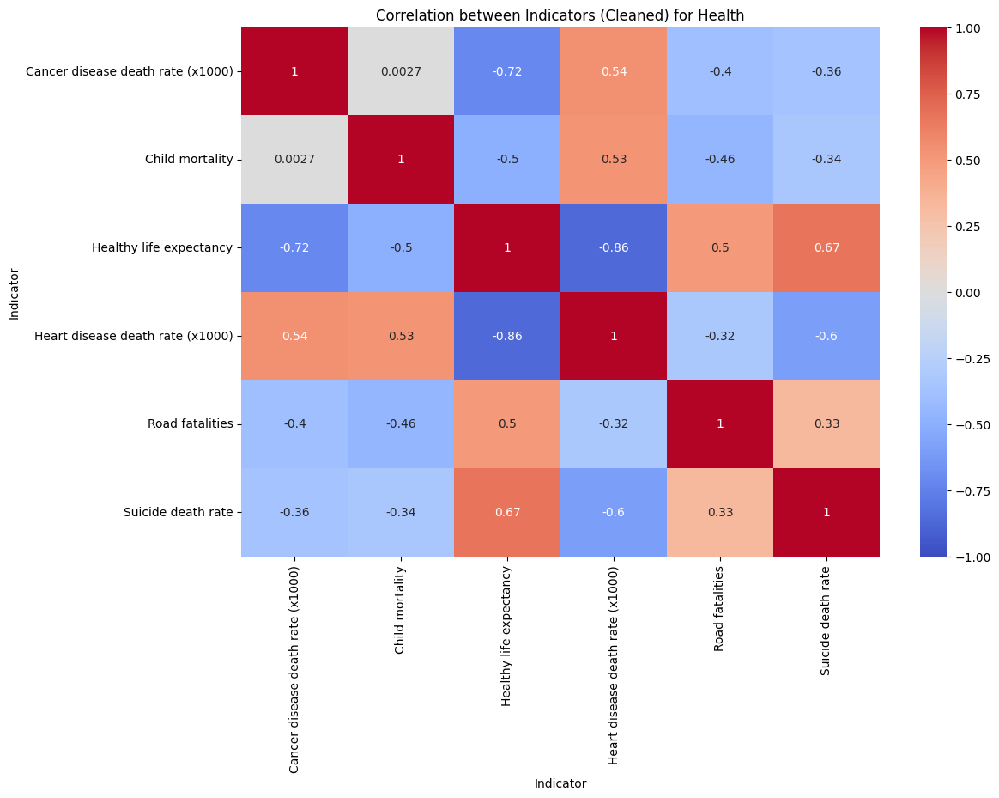

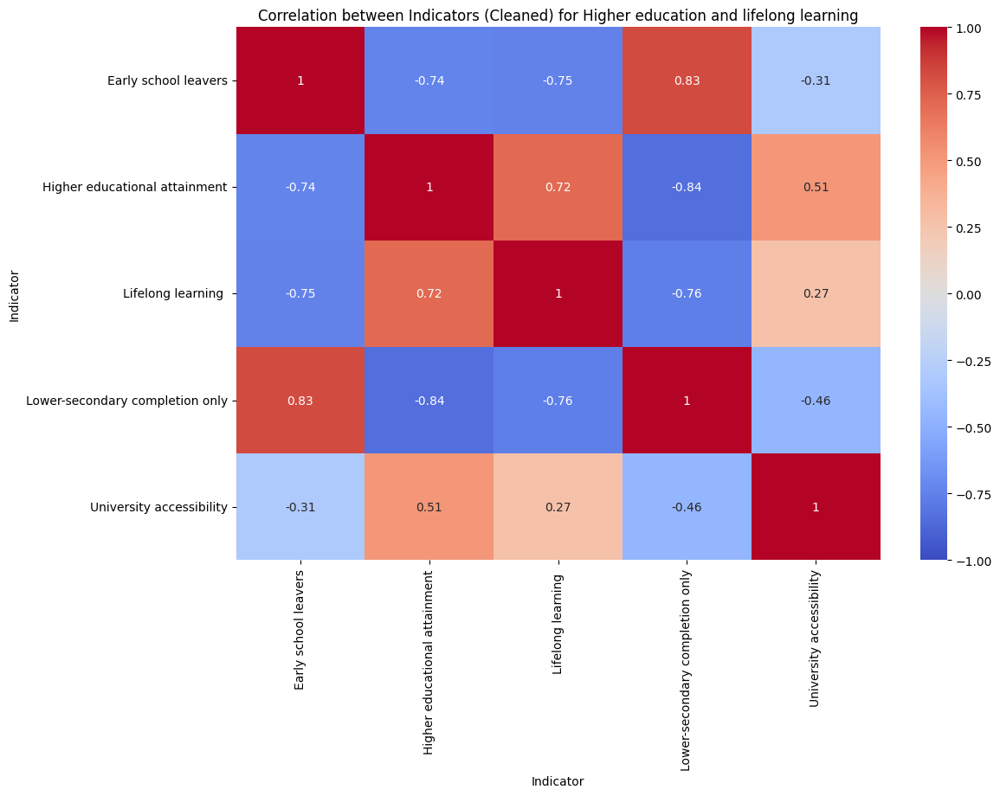

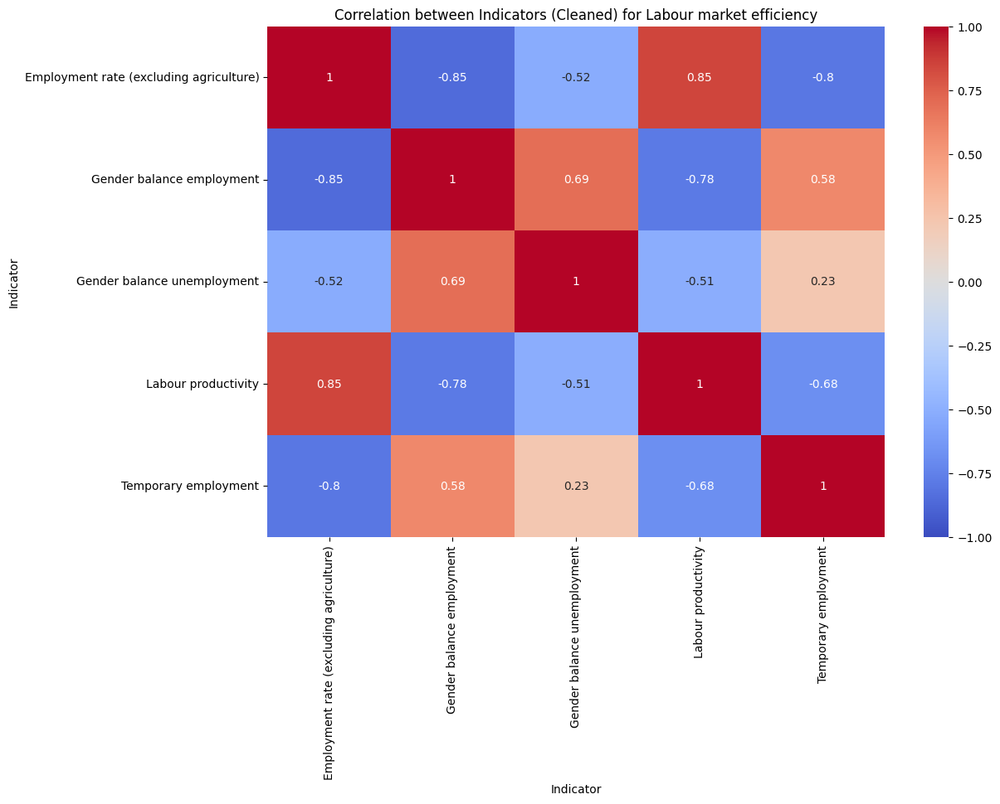

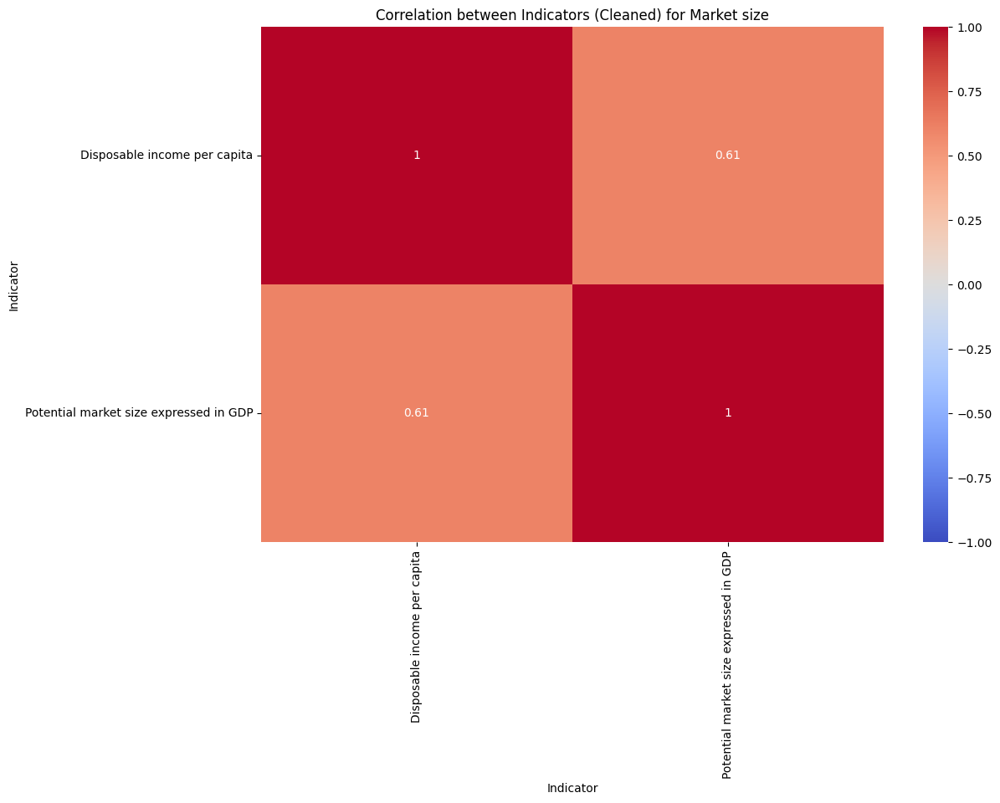

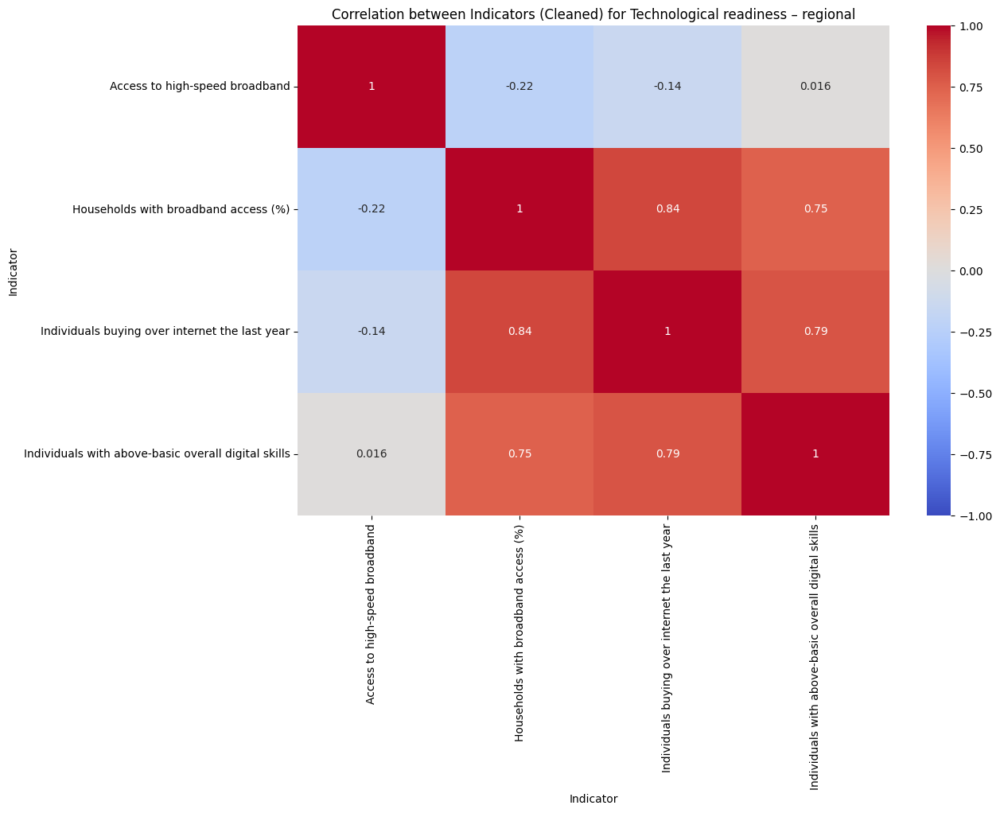

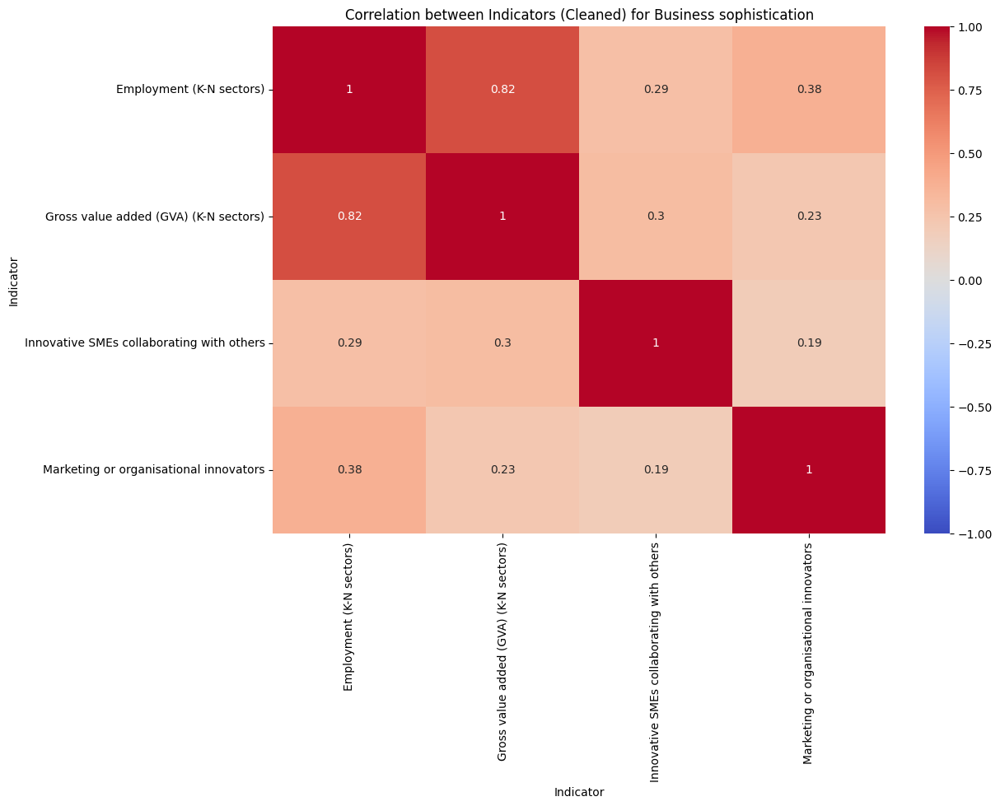

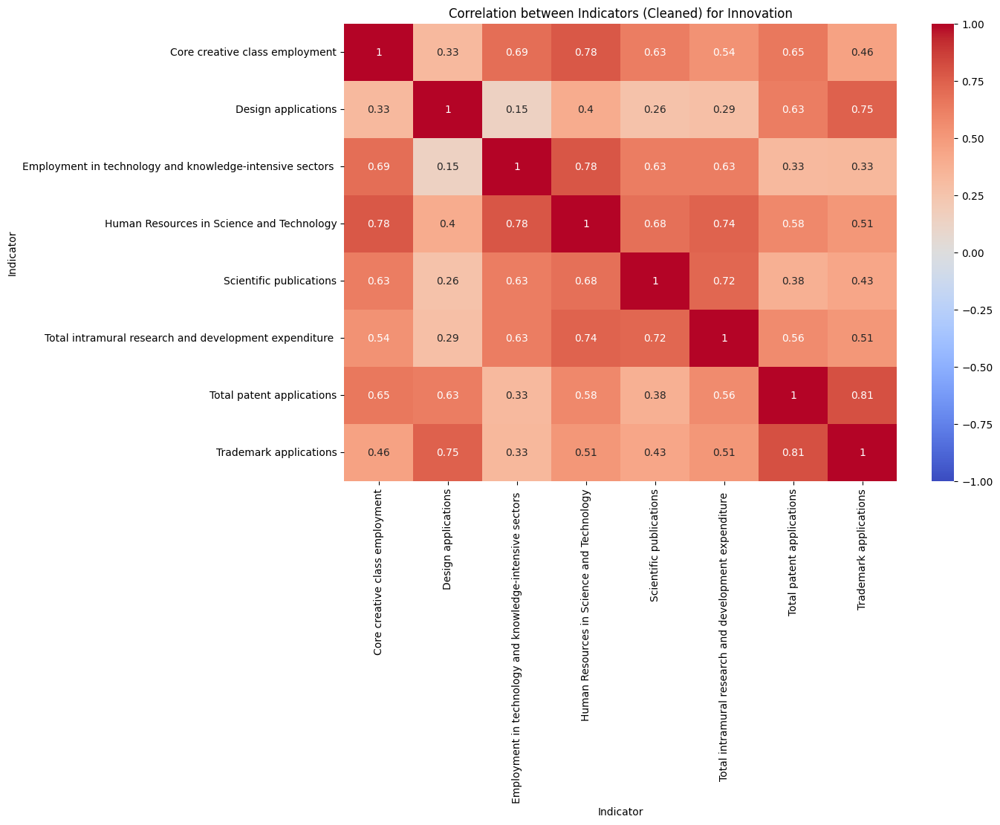

All Pillars have valid correlation matrices.
Indicators removed: {'Labour market slack', 'NEET rate', 'Unemployment rate', 'Potential market size expressed in population', 'Long-term unemployment', 'Quality and accountability', 'Knowledge workers'}
(840, 5)


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Get unique Pillar names
pillar_names = RCI22_data_IT_L_CLEAN['Pillar'].unique()

# List to store names of pillars with empty correlation matrices
empty_correlation_pillars = []

# Set to store all removed indicators
indicators_removed = set()

# Set the threshold to consider correlation as "too high"
corr_threshold = 0.9

# Loop through each Pillar
for pillar_name in pillar_names:
    # Filter the dataset for the current Pillar
    df_pillar = RCI22_data_IT_L_CLEAN[RCI22_data_IT_L_CLEAN['Pillar'] == pillar_name]

    # Create the pivot table for correlation
    df_pivot = df_pillar.pivot(index='Region name', columns='Indicator', values='Value')

    # Calculate the correlation matrix
    correlation_matrix = df_pivot.corr()

    # Track columns to remove
    cols_to_remove = set()

    # Check pairs of variables with correlation > corr_threshold
    for i in range(len(correlation_matrix.columns)):
        for j in range(i + 1, len(correlation_matrix.columns)):
            if abs(correlation_matrix.iloc[i, j]) > corr_threshold:
                # If correlation is greater than 0.9, remove one of the two variables
                col_to_remove = correlation_matrix.columns[j]
                cols_to_remove.add(col_to_remove)

    # Add indicators to be removed to the list of removed indicators
    indicators_removed.update(cols_to_remove)

    # Remove columns with high correlation
    df_pivot_clean = df_pivot.drop(columns=cols_to_remove)

    # Recreate the cleaned correlation matrix
    correlation_matrix_clean = df_pivot_clean.corr()

    # Check if the matrix is empty (no variables left)
    if correlation_matrix_clean.empty:
        empty_correlation_pillars.append(pillar_name)
    else:
        # Plot the resulting cleaned correlation matrix
        plt.figure(figsize=(12, 8))  # Plot size
        sns.heatmap(correlation_matrix_clean, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
        plt.title(f'Correlation between Indicators (Cleaned) for {pillar_name}')
        plt.xticks(rotation=90)
        plt.yticks(rotation=0)
        plt.show()

# Remove the highly correlated indicators from the main dataset
RCI22_data_IT_L_CLEAN_NOCOR = RCI22_data_IT_L_CLEAN[~RCI22_data_IT_L_CLEAN['Indicator'].isin(indicators_removed)]

# Show any Pillars with empty correlation matrices
if empty_correlation_pillars:
    print("Pillars with empty correlation matrices:", empty_correlation_pillars)
else:
    print("All Pillars have valid correlation matrices.")

# Show indicators removed due to high correlation
print("Indicators removed:", indicators_removed)

# Show the final dataset without highly correlated indicators
print(RCI22_data_IT_L_CLEAN_NOCOR.shape)

### **Variable Removal Based on CV**

In this section, the **coefficient of variation (CV)** was calculated to compare how effectively each indicator discriminates between classes, without the bias of different data scales. Indicators with a **CV of 0.15 or lower were removed**.


In [ ]:
import pandas as pd

# Function to calculate the CV
def calculate_cv(group):
    mean = group['Value'].mean()
    std_dev = group['Value'].std()
    # If the mean is 0, CV cannot be calculated
    if mean == 0:
        return float('nan')
    return std_dev / abs(mean)

# Calculate the CV for each indicator
cv_indicators = RCI22_data_IT_L_CLEAN_NOCOR.groupby('Indicator').apply(calculate_cv).reset_index(name='CV')

/var/folders/w7/0xpq0vds7cz2333831nfq5dc0000gn/T/ipykernel_17228/1040940222.py:13: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  cv_indicators = RCI22_data_IT_L_CLEAN_NOCOR.groupby('Indicator').apply(calculate_cv).reset_index(name='CV')


In [ ]:
cv_indicators

,Indicator,CV
0,Access to high-speed broadband,0.750304
1,Accessibility to passenger flights,0.960752
2,Cancer disease death rate (x1000),0.091361
3,Child mortality,0.262049
4,Core creative class employment,0.180759
5,Corruption,0.479088
6,Design applications,0.543735
7,Disposable income per capita,0.252630
8,Early school leavers,0.294879
9,Employment (K-N sectors),0.155651


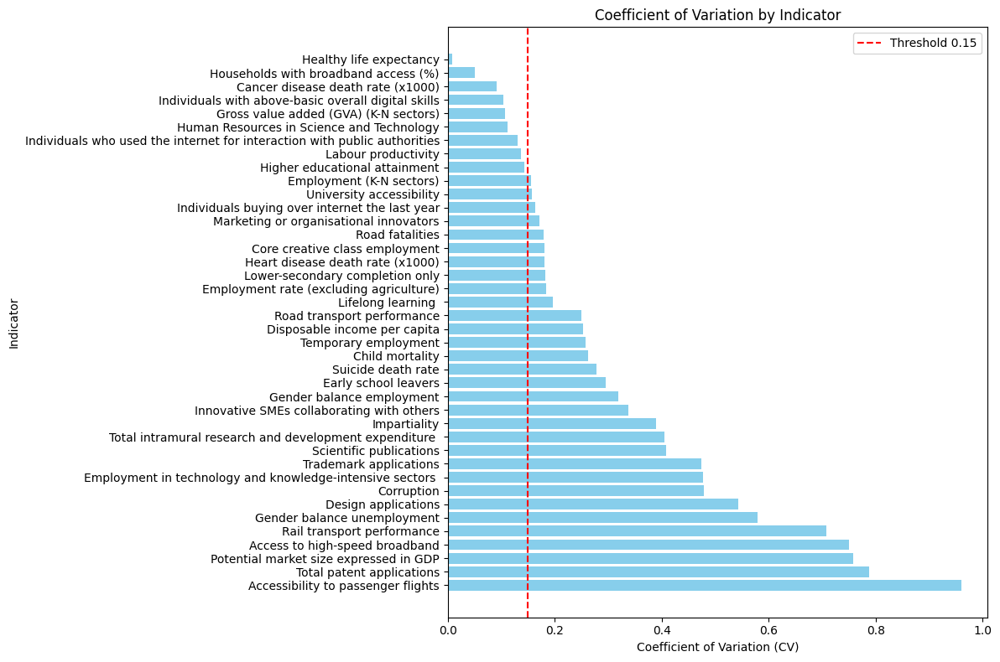

In [ ]:
import matplotlib.pyplot as plt

# Sort the data in descending order
cv_indicators_sorted = cv_indicators.sort_values(by='CV', ascending=False)

# Create the plot
plt.figure(figsize=(12, 8))

# Create a horizontal bar plot
plt.barh(cv_indicators_sorted['Indicator'], cv_indicators_sorted['CV'], color='skyblue')

# Add horizontal lines at CV values of 0.15 and 1
plt.axvline(x=0.15, color='red', linestyle='--', label='Threshold 0.15')

# Configure the plot
plt.title('Coefficient of Variation by Indicator')
plt.xlabel('Coefficient of Variation (CV)')
plt.ylabel('Indicator')

plt.legend()
plt.tight_layout()
plt.show()

<Figure size 1200x1200 with 0 Axes>

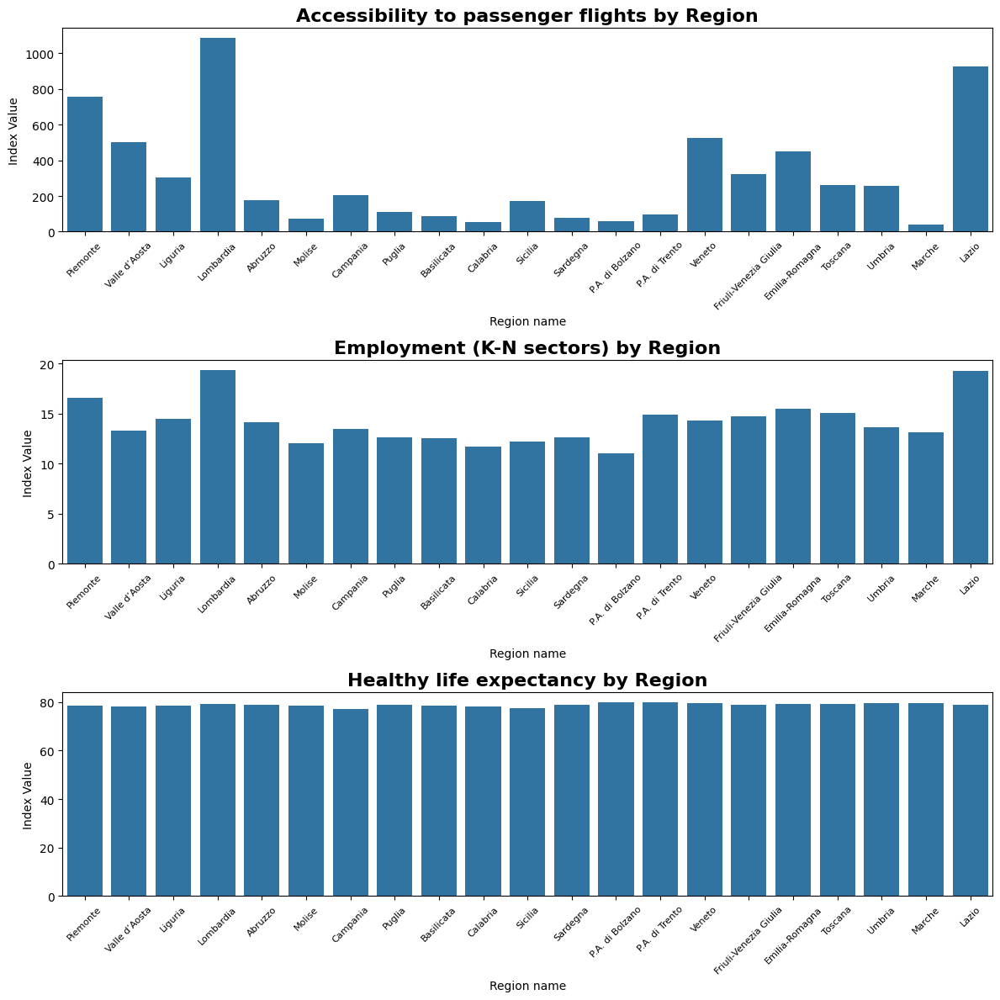

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Define the indicators of interest
indicators = ['Accessibility to passenger flights', 'Employment (K-N sectors)', 'Healthy life expectancy']

# Initialize a figure with 3 subplots
plt.figure(figsize=(12, 12))

RCI22_data_IT_L_CLEAN_copy_temp = RCI22_data_IT_L_CLEAN.copy()

# Modifica temporanea dei nomi delle regioni per i label nei grafici
# Utilizzo di .loc per modificare i valori del DataFrame in modo corretto
RCI22_data_IT_L_CLEAN_copy_temp.loc[RCI22_data_IT_L_CLEAN_copy_temp['Region name'] == 'Valle d’Aosta/Vallée d’Aoste', 'Region name'] = 'Valle d’Aosta'
RCI22_data_IT_L_CLEAN_copy_temp.loc[RCI22_data_IT_L_CLEAN_copy_temp['Region name'] == 'Prov. Autonoma di Bolzano/Bozen', 'Region name'] = 'P.A. di Bolzano'
RCI22_data_IT_L_CLEAN_copy_temp.loc[RCI22_data_IT_L_CLEAN_copy_temp['Region name'] == 'Prov. Autonoma di Trento', 'Region name'] = 'P.A. di Trento'

# Define the indicators of interest
indicators = ['Accessibility to passenger flights', 'Employment (K-N sectors)', 'Healthy life expectancy']

# Initialize a figure with 3 subplots
plt.figure(figsize=(12, 12))

# Iterate over each indicator and create a plot
for i, indicator in enumerate(indicators):
    plt.subplot(3, 1, i + 1)  # 3 rows, 1 column, i-th plot

    # Filter data for the current indicator
    df_indicator = RCI22_data_IT_L_CLEAN_copy_temp[RCI22_data_IT_L_CLEAN_copy_temp['Indicator'] == indicator]

    # Check if there is data for the indicator
    if df_indicator.empty:
        print(f'No data available for indicator: {indicator}')
        continue

    # Create the bar plot
    sns.barplot(data=df_indicator, x='Region name', y='Value')
    plt.title(f'{indicator} by Region', fontsize=16, weight='bold')
    plt.ylabel('Index Value')
    plt.xticks(rotation=45, fontsize=8)  # Rotate x-axis labels for better readability

# Display all plots
plt.tight_layout()
plt.show()


In [ ]:
# Filter indicators with CV greater than 0.15
high_cv_indicators = cv_indicators[cv_indicators['CV'] > 0.15]

# Merge the filtered data with the original dataset to keep only the high CV indicators
RCI22_data_IT_L_CLEAN_FINAL = RCI22_data_IT_L_CLEAN_NOCOR[RCI22_data_IT_L_CLEAN_NOCOR['Indicator'].isin(high_cv_indicators['Indicator'])]

RCI22_data_IT_L_CLEAN_FINAL.shape  # (651, 5) 651/21 = 31

(651, 5)

### **Missing Values Imputation ad Data standardization**

In this section, 2 missing values in the dataset were imputed using `KNNImputer` ([scikit-learn documentation](https://scikit-learn.org/stable/modules/generated/sklearn.impute.KNNImputer.html)). The dataset was then standardized to prepare it for clustering.

In [ ]:
import pandas as pd
from sklearn.impute import KNNImputer

# Create a dictionary containing dataframes for each "Indicator"
grouped_dfs = {indicator: group for indicator, group in RCI22_data_IT_L_CLEAN_FINAL.groupby("Indicator")}

# Function to apply KNNImputer to each indicator group
def impute_group(group):
    imputer = KNNImputer(n_neighbors=5)  # Number of neighbors (k) can be adjusted
    # Imputation is done only on the "Value" column
    group_values_imputed = imputer.fit_transform(group[['Value']])
    group['Value'] = group_values_imputed  # Replace the original values with imputed values
    return group

# Apply KNNImputer to each group
imputed_dfs = [impute_group(group) for indicator, group in grouped_dfs.items()]

# Concatenate the groups to obtain the final DataFrame
RCI22_data_IT_L_CLEAN_FINAL_imputed = pd.concat(imputed_dfs)

RCI22_data_IT_L_CLEAN_FINAL_imputed

,NUTS,Region name,Pillar,Indicator,Value
1050,ITC1,Piemonte,Technological readiness – regional,Access to high-speed broadband,30.715550
1051,ITC2,Valle d’Aosta/Vallée d’Aoste,Technological readiness – regional,Access to high-speed broadband,1.144197
1052,ITC3,Liguria,Technological readiness – regional,Access to high-speed broadband,37.287688
1053,ITC4,Lombardia,Technological readiness – regional,Access to high-speed broadband,26.252985
1054,ITF1,Abruzzo,Technological readiness – regional,Access to high-speed broadband,17.687681
...,...,...,...,...,...
730,ITH5,Emilia-Romagna,Higher education and lifelong learning,University accessibility,89.595150
731,ITI1,Toscana,Higher education and lifelong learning,University accessibility,89.946655
732,ITI2,Umbria,Higher education and lifelong learning,University accessibility,95.868828
733,ITI3,Marche,Higher education and lifelong learning,University accessibility,97.082117


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Create a dictionary containing dataframes for each "Indicator"
grouped_dfs_imputed = {indicator: group for indicator, group in RCI22_data_IT_L_CLEAN_FINAL_imputed.groupby("Indicator")}

# Function to standardize data for each indicator group
def standardize_group(group):
    scaler = StandardScaler()  # Create the scaler
    # Apply the scaler only to the "Value" column
    group_values_standardized = scaler.fit_transform(group[['Value']])
    group['Value'] = group_values_standardized  # Replace the original values with standardized values
    return group

# Apply standardization to each group
standardized_dfs = [standardize_group(group) for indicator, group in grouped_dfs_imputed.items()]

# Concatenate the groups to obtain the final standardized DataFrame
RCI22_data_IT_L_CLEAN_FINAL_standardized = pd.concat(standardized_dfs)

RCI22_data_IT_L_CLEAN_FINAL_standardized

,NUTS,Region name,Pillar,Indicator,Value
1050,ITC1,Piemonte,Technological readiness – regional,Access to high-speed broadband,1.679474
1051,ITC2,Valle d’Aosta/Vallée d’Aoste,Technological readiness – regional,Access to high-speed broadband,-1.252269
1052,ITC3,Liguria,Technological readiness – regional,Access to high-speed broadband,2.331045
1053,ITC4,Lombardia,Technological readiness – regional,Access to high-speed broadband,1.237050
1054,ITF1,Abruzzo,Technological readiness – regional,Access to high-speed broadband,0.387874
...,...,...,...,...,...
730,ITH5,Emilia-Romagna,Higher education and lifelong learning,University accessibility,0.261347
731,ITI1,Toscana,Higher education and lifelong learning,University accessibility,0.287800
732,ITI2,Umbria,Higher education and lifelong learning,University accessibility,0.733473
733,ITI3,Marche,Higher education and lifelong learning,University accessibility,0.824779


### **Creation of Wide-Format Dataset and Sub-Datasets**

In [ ]:
import pandas as pd

# Use pivot to transform the dataset from long to wide format
RCI22_data_IT_W_FINAL = RCI22_data_IT_L_CLEAN_FINAL_standardized.pivot(index=['NUTS', 'Region name'], columns='Indicator', values='Value')

# This removes the hierarchical index created by pivot and returns the data in a clean DataFrame
RCI22_data_IT_W_FINAL.reset_index(inplace=True)

# Show the result
RCI22_data_IT_W_FINAL

Indicator,NUTS,Region name,Access to high-speed broadband,Accessibility to passenger flights,Child mortality,Core creative class employment,Corruption,Design applications,Disposable income per capita,Early school leavers,...,Rail transport performance,Road fatalities,Road transport performance,Scientific publications,Suicide death rate,Temporary employment,Total intramural research and development expenditure,Total patent applications,Trademark applications,University accessibility
0,ITC1,Piemonte,1.679474,1.519738,-0.278604,0.332484,0.883215,-0.248320,0.699504,-0.161576,...,1.038354,-0.212436,1.746381,-0.112738,0.443716,-1.233951,2.118978,0.857573,0.083189,0.589223
1,ITC2,Valle d’Aosta/Vallée d’Aoste,-1.252269,0.646638,-0.913953,0.756680,0.072909,0.062498,0.488143,0.000000,...,-1.150753,-1.145329,-0.771916,-2.001060,0.259268,-0.209215,-1.537067,0.013302,-1.276190,0.942854
2,ITC3,Liguria,2.331045,-0.032106,-0.333471,0.855431,0.694985,-1.037373,0.467007,-0.209708,...,1.518608,0.050089,0.985314,0.527783,-1.639861,-0.918573,0.532888,-0.156186,-0.516399,0.502297
3,ITC4,Lombardia,1.237050,2.657921,0.037115,0.916595,-0.236981,0.600516,1.439267,-0.112124,...,2.372343,-1.284476,1.399845,0.248022,0.054326,-1.499997,0.204779,1.700021,1.397329,0.861283
4,ITF1,Abruzzo,0.387874,-0.468513,0.613833,-0.038742,-0.349460,-0.334995,-0.632070,-0.994970,...,-0.467856,0.153225,-0.348961,0.106650,0.122640,0.555342,-0.343531,-0.520161,-0.274705,0.715292
5,ITF2,Molise,0.254949,-0.815087,-2.067898,-0.921292,-0.287482,-1.492458,-1.033655,-0.843867,...,-1.046787,2.314695,-1.334977,-0.680973,-0.772273,-0.600206,-0.117128,-0.784455,-0.890641,-0.936434
6,ITF3,Campania,0.789872,-0.361423,1.042851,-1.185622,-2.401622,-0.589619,-1.287289,1.512974,...,1.549436,-1.948677,1.002438,-0.076191,-1.872129,0.494861,0.155285,-1.017831,-0.030167,0.632620
7,ITF4,Puglia,0.153745,-0.688059,0.410765,-1.739651,-0.645577,-0.057346,-1.181608,1.520558,...,0.075767,-0.608550,0.529469,-0.905005,-0.826925,1.220521,-0.883716,-1.043058,-0.466844,0.176490
8,ITF5,Basilicata,-0.239211,-0.769151,1.092516,-1.119210,-0.797079,-0.573578,-1.097064,-0.513681,...,-1.315588,0.187467,-0.667474,-1.100478,-0.478523,1.009720,-1.245412,-1.115261,-1.284073,-2.418030
9,ITF6,Calabria,-1.005596,-0.878918,2.402588,-1.549487,-1.768069,-1.242101,-1.519785,1.387847,...,-0.028427,-0.258078,-0.078165,-0.858841,-0.697128,2.255129,-1.371934,-1.103541,-1.247880,-1.617987


In [ ]:
import pandas as pd

# Create a dictionary to hold wide-format dataframes, one for each Pillar
pillar_dfs = {}

# Get the unique list of Pillars
pillars = RCI22_data_IT_L_CLEAN_FINAL_standardized['Pillar'].unique()

# For each Pillar, create a wide-format dataset
for pillar in pillars:
    # Filter the data for the current Pillar
    pillar_data = RCI22_data_IT_L_CLEAN_FINAL_standardized[RCI22_data_IT_L_CLEAN_FINAL_standardized['Pillar'] == pillar]

    # Create the wide-format dataframe with NUTS and Region name as the index, and Indicators as columns
    pillar_wide = pillar_data.pivot(index=['NUTS', 'Region name'], columns='Indicator', values='Value')

    # Add the wide-format dataframe to the dictionary
    pillar_dfs[pillar] = pillar_wide.reset_index()

# Example: Get the wide-format dataframe for a specific Pillar
pillar_example = pillar_dfs['Technological readiness – regional']  # Replace with the Pillar of interest

In [ ]:
pillar_dfs.keys()

dict_keys(['Technological readiness – regional', 'Infrastructure', 'Health', 'Innovation', 'Institutions – regional', 'Market size', 'Higher education and lifelong learning', 'Business sophistication', 'Labour market efficiency'])

# **CLUSTERING**

In this section, **Mean Shift Clustering** ([scikit-learn documentation](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.MeanShift.html)) was performed on the regions based on the 31 indices remaining after preprocessing. For subsequent evaluations, **clustering was also conducted by filtering only the indices belonging to the same Pillar**. For each clustering, a **silhouette score** was calculated to assess the confidence in the division chosen by the algorithm.


## **Region Clusters**

In [ ]:
import pandas as pd
from sklearn.cluster import MeanShift
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_samples

# Exclude non-numeric and non-relevant columns for clustering
df_numeric = RCI22_data_IT_W_FINAL.select_dtypes(include=['float64', 'int64'])

# Set seed
np.random.seed(23)

# Apply Mean Shift clustering
mean_shift = MeanShift()
clusters = mean_shift.fit_predict(df_numeric)

# Calculate the silhouette index for each point
silhouette_vals = silhouette_samples(df_numeric, clusters)

# Add the cluster and silhouette index to the original DataFrame for analysis
RCI22_data_IT_W_FINAL['Cluster'] = clusters
RCI22_data_IT_W_FINAL['Silhouette Index'] = silhouette_vals

# Display the results
print(RCI22_data_IT_W_FINAL[['NUTS', 'Region name', 'Cluster', 'Silhouette Index']])

Indicator  NUTS                      Region name  Cluster  Silhouette Index
0          ITC1                         Piemonte        0         -0.050472
1          ITC2     Valle d’Aosta/Vallée d’Aoste        0          0.166510
2          ITC3                          Liguria        0          0.131137
3          ITC4                        Lombardia        2          0.223136
4          ITF1                          Abruzzo        1          0.022128
5          ITF2                           Molise        1          0.156668
6          ITF3                         Campania        1          0.341082
7          ITF4                           Puglia        1          0.369117
8          ITF5                       Basilicata        1          0.345770
9          ITF6                         Calabria        1          0.457187
10         ITG1                          Sicilia        1          0.435081
11         ITG2                         Sardegna        1          0.153933
12         I

In [ ]:
# Print the 'Silhouette Index' column as a list
print(RCI22_data_IT_W_FINAL['Silhouette Index'].tolist())

[-0.05047207528474059, 0.16650993024270802, 0.1311367101779722, 0.2231355703864605, 0.022128187524993622, 0.1566682626046852, 0.34108229339362317, 0.36911656119447833, 0.345769811205983, 0.45718739467365804, 0.43508130012161383, 0.15393252678005895, 0.301359784235273, 0.2732609784104311, 0.2754454104407846, 0.33610509645361847, 0.2287931480302439, 0.27451120098221704, 0.32013686731282287, 0.3082011961103622, 0.19780039258475415]


### **Get Scores for Each Region Cluster**

After grouping the Italian regions based on common characteristics recorded in the preserved indicators, the goal is to create a score for each cluster that summarizes its main aspects. In other words, an aggregated indicator is to be developed to approximate the function of the RCI, in order to capture similarities between the regions of the country.

This score (`Score`) for each cluster is an aggregated measure based on the values of the indicators within the cluster. It is calculated using the weights of the indicators, which reflect the relative importance of each indicator (particularly their impact on clustering), and the signs of correlations, which indicate the positive or negative effect of the indicators relative to the reference index (RCI 2.0 - 2022) that is being summarized.

In [ ]:
# Convert the 'Indicator' column of high_cv_indicators DataFrame to a list
idc_to_keep = high_cv_indicators['Indicator'].tolist()

# Add 'Region name' to the list of columns to keep
idc_to_keep.append('Region name')

In [ ]:
# Create a DataFrame with selected columns from RCI22_index
sub_index_sn1 = RCI22_index[['REGION NAME', 'RCI 2.0 - 2022']]

# Merge the new DataFrame with RCI22_data_IT based on region names
# Use 'REGION NAME' from sub_index_sn1 and 'Region name' from RCI22_data_IT for merging
# Drop the 'Region name' column from the result, as it's redundant after merging
compute_corr = sub_index_sn1.merge(RCI22_data_IT[idc_to_keep], left_on='REGION NAME', right_on='Region name').drop(columns='Region name')

In [ ]:
# Select only numeric columns for correlation calculation
numeric_cols_corr = compute_corr.select_dtypes(include=['float64', 'int64'])

# Replace NaN values with the mean of each numeric column
numeric_cols_filled = numeric_cols_corr.fillna(numeric_cols_corr.mean())

# Reassemble the DataFrame by combining the modified numeric columns with the original qualitative columns
compute_corr[numeric_cols_corr.columns] = numeric_cols_filled

# Display the first few rows of the updated DataFrame
compute_corr.head()

,REGION NAME,RCI 2.0 - 2022,Access to high-speed broadband,Accessibility to passenger flights,Child mortality,Core creative class employment,Corruption,Design applications,Disposable income per capita,Early school leavers,...,Rail transport performance,Road fatalities,Road transport performance,Scientific publications,Suicide death rate,Temporary employment,Total intramural research and development expenditure,Total patent applications,Trademark applications,University accessibility
0,Lombardia,103.2,26.252985,1086.829722,2.500225,8.612542,-1.035,148.086801,26000.0,11.565966,...,12.044891,41.164177,96.120325,1.407724,5.47,7.011614,1.333240,135.694656,154.689261,97.567183
1,Emilia-Romagna,93.6,17.388603,452.197642,2.533558,8.445380,-0.681,188.393755,24500.0,10.159758,...,4.356562,66.610841,77.601951,1.652996,5.95,10.248314,2.070979,155.203743,152.386319,89.595150
2,Veneto,92.6,10.705396,525.170897,2.199705,7.253185,-0.345,204.982748,22300.0,9.401002,...,2.971670,59.718749,84.575112,1.136930,5.79,8.446373,1.388103,119.722704,177.385291,91.431532
3,Lazio,91.4,1.920949,928.066072,2.467834,9.681927,-1.289,71.009986,21600.0,11.036043,...,8.175764,51.304215,90.995347,2.044064,3.53,9.819118,1.859252,39.446165,92.847800,92.407927
4,Prov. Autonoma di Trento,90.2,0.664755,95.569599,2.332426,9.691469,-0.461,114.674587,22600.0,7.836340,...,1.242183,49.108557,43.369348,2.516440,7.62,13.405193,1.575265,95.488421,100.365309,92.211649


In [ ]:
# Calculate the correlation matrix for the numeric columns
corr_matrix_sign = numeric_cols_filled.corr()
# Compute the sign (positive or negative) of the correlations with respect to 'RCI 2.0 - 2022'
signs_feat = np.sign(corr_matrix_sign['RCI 2.0 - 2022'])
# Create a dictionary with variable names as keys and the sign of their correlation with 'RCI 2.0 - 2022' as values
sign_dict_feat = signs_feat.to_dict()
# Remove the entry for 'RCI 2.0 - 2022' itself from the dictionary
sign_dict_feat.pop('RCI 2.0 - 2022')

1.0

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

# Calculate the overall silhouette score for the dataset
df_sn1 = RCI22_data_IT_W_FINAL.select_dtypes(include=['float64', 'int64'])

# Set a seed for reproducibility
np.random.seed(23)

# Calculate the average silhouette score using current clusters
silhouette_avg = silhouette_score(df_sn1, clusters)

# Function to calculate silhouette score excluding a specific feature
def silhouette_without_feature(df, feature_to_remove):
    # Drop the specified feature
    df_reduced = df.drop(columns=[feature_to_remove])
    # Recalculate clusters without the excluded feature
    clusters_reduced = mean_shift.fit_predict(df_reduced)
    # Return the silhouette score for the reduced feature set
    return silhouette_score(df_reduced, clusters_reduced)

# Calculate the impact of each feature on the silhouette score
feature_importance = {}
for feature in df_sn1.columns:
    # Calculate silhouette score without the current feature
    silhouette_score_reduced = silhouette_without_feature(df_sn1, feature)
    # Determine the impact of removing the feature
    impact = silhouette_avg - silhouette_score_reduced
    feature_importance[feature] = abs(impact)

# Normalize the impacts to obtain weights
total_impact = sum(feature_importance.values())
feature_weights = {feature: impact / total_impact for feature, impact in feature_importance.items()}

# Display the feature weights
print(feature_weights)

{'Access to high-speed broadband': 0.09157512171289424, 'Accessibility to passenger flights': 0.0188900755622747, 'Child mortality': 0.01267020120917288, 'Core creative class employment': 0.14650350502269058, 'Corruption': 0.014244792972458974, 'Design applications': 0.0011198399915829129, 'Disposable income per capita': 0.01050284193983663, 'Early school leavers': 0.014589945788825588, 'Employment (K-N sectors)': 0.016761758326361016, 'Employment in technology and knowledge-intensive sectors ': 0.07667211904746468, 'Employment rate (excluding agriculture)': 0.011179432162796729, 'Gender balance employment': 0.12813169211325237, 'Gender balance unemployment': 0.0048068110629390405, 'Heart disease death rate (x1000)': 0.0058638052756239374, 'Impartiality': 0.01233516698805848, 'Individuals buying over internet the last year': 0.006118643873912569, 'Innovative SMEs collaborating with others': 0.01750114629869214, 'Lifelong learning ': 0.0033224739057040823, 'Lower-secondary completion on

In [ ]:
# Assume 'clusters' contains the cluster assignments for each row in the dataset
clusters = RCI22_data_IT_W_FINAL['Cluster']

# Initialize a list to collect cluster scores
cluster_scores_RCI = []

# Loop through each unique cluster
for cluster in np.unique(clusters):
    # Filter data for the current cluster and drop unnecessary columns
    cluster_data_RCI = RCI22_data_IT_W_FINAL[RCI22_data_IT_W_FINAL['Cluster'] == cluster].drop(columns=['NUTS', 'Region name', 'Cluster', 'Silhouette Index'])

    # Calculate the mean of features for the current cluster
    cluster_means_RCI = cluster_data_RCI.mean()

    # Calculate the cluster score as a weighted sum of means
    cluster_score_RCI = sum(cluster_means_RCI[feature] * feature_weights[feature] * sign_dict_feat[feature] for feature in feature_weights if feature in cluster_means_RCI)

    # Add the result to the list as a dictionary
    cluster_scores_RCI.append({'Cluster': cluster, 'Score': cluster_score_RCI})

# Convert the list of dictionaries to a DataFrame
df_cluster_scores_RCI = pd.DataFrame(cluster_scores_RCI)

# Define colors based on descending order of scores
colors = ['#fde725', '#35b779', '#440154']

# Sort the DataFrame by scores in descending order
df_cluster_scores_sort_RCI = df_cluster_scores_RCI.sort_values(by='Score', ascending=False).reset_index(drop=True)

# Initialize the 'Color' column as empty
df_cluster_scores_sort_RCI['Color'] = pd.NA

# Assign colors based on the order of scores
for i, color in enumerate(colors):
    if i < len(df_cluster_scores_sort_RCI):
        df_cluster_scores_sort_RCI.at[i, 'Color'] = color

# Select the 'Cluster' and 'Color' columns to create the dictionary
assign_colors_RCI = df_cluster_scores_sort_RCI[['Cluster', 'Color']].drop_duplicates().set_index('Cluster').to_dict()['Color']

# Output the color assignments for each cluster
assign_colors_RCI

{2: '#fde725', 0: '#35b779', 1: '#440154'}

In [ ]:
RCI22_data_IT_W_FINAL[['Region name', 'Cluster']]

Indicator,Region name,Cluster
0,Piemonte,0
1,Valle d’Aosta/Vallée d’Aoste,0
2,Liguria,0
3,Lombardia,2
4,Abruzzo,1
5,Molise,1
6,Campania,1
7,Puglia,1
8,Basilicata,1
9,Calabria,1


## **Region Clusters by Pillar**

Proceed exactly as done previously. However, this time clustering will be performed by grouping the indices according to their pillar of affiliation. In this case as well, it will be necessary to calculate the customized `Score` index for each cluster.

In [ ]:
from sklearn.cluster import MeanShift
from sklearn.metrics import silhouette_samples, silhouette_score

# Suppose 'pillar_dfs' is a dictionary of dataframes
# and 'feature_weights' is a dictionary of feature weights calculated previously.

clustered_pillar_dfs = {}

# Loop through each pillar's wide-format dataset
for pillar, df_wide in pillar_dfs.items():
    # Create a copy of the dataframe to avoid modifying the original
    df_wide_copy = df_wide.copy()

    # Exclude non-numeric columns for clustering
    df_numeric = df_wide_copy.select_dtypes(include=['float64', 'int64'])

    # Apply Mean Shift clustering
    mean_shift = MeanShift()
    clusters = mean_shift.fit_predict(df_numeric)

    # Compute the silhouette index for each point
    silhouette_vals = silhouette_samples(df_numeric, clusters)

    # Compute the average silhouette score for the entire dataset
    silhouette_avg = silhouette_score(df_numeric, clusters)

    # Add cluster labels and silhouette index to the dataframe
    df_wide_copy['Cluster'] = clusters
    df_wide_copy['Silhouette Index'] = silhouette_vals

    # Function to calculate silhouette score without a specific feature
    def silhouette_without_feature(df, feature_to_remove):
        df_reduced = df.drop(columns=[feature_to_remove])
        clusters_reduced = mean_shift.fit_predict(df_reduced)
        return silhouette_score(df_reduced, clusters_reduced)

    # Calculate the impact of each feature
    feature_importance = {}
    for feature in df_numeric.columns:
        silhouette_score_reduced = silhouette_without_feature(df_numeric, feature)
        impact = silhouette_avg - silhouette_score_reduced
        feature_importance[feature] = abs(impact)

    # Normalize the impacts to get feature weights
    total_impact = sum(feature_importance.values())
    feature_weights = {feature: impact / total_impact for feature, impact in feature_importance.items()}

    # Calculate the score for each cluster
    cluster_scores = []
    for cluster in np.unique(clusters):
        # Filter data for the current cluster and remove unnecessary columns
        cluster_data = df_wide_copy[df_wide_copy['Cluster'] == cluster].drop(columns=['NUTS', 'Region name', 'Cluster', 'Silhouette Index'])

        # Calculate the mean of features for the cluster
        cluster_means = cluster_data.mean()

        # Calculate the cluster score as the weighted sum of feature means
        cluster_score = sum(cluster_means[feature] * feature_weights.get(feature, 0) * sign_dict_feat[feature] for feature in feature_weights)

        # Add the result to the list as a dictionary
        cluster_scores.append({'Cluster': cluster, 'Score': cluster_score})

    # Convert the list of dictionaries to a DataFrame
    df_cluster_scores = pd.DataFrame(cluster_scores)

    # Get the number of unique clusters
    num_clusters = len(df_cluster_scores['Cluster'].unique())

    # Define colors based on the number of clusters
    if num_clusters == 3:
        colors = ['#fde725', '#35b779', '#440154']
    elif num_clusters == 4:
        colors = ['#fde725', '#35b779', '#3f4889', '#440154']
    elif num_clusters == 5:
        colors = ['#fde725', '#a8db33', '#35b779', '#3f4889', '#440154']
    else:
        # Default to 3 colors if the number of clusters doesn't match 3, 4, or 5
        colors = ['#fde725', '#35b779', '#440154']

    # Sort the DataFrame based on scores in descending order
    df_cluster_scores_sort = df_cluster_scores.sort_values(by='Score', ascending=False).reset_index(drop=True)

    # Initialize the Color column as a string
    df_cluster_scores_sort['Color'] = pd.NA

    # Assign colors based on the order of scores
    for i, color in enumerate(colors):
        if i < len(df_cluster_scores_sort):
            df_cluster_scores_sort.at[i, 'Color'] = color

    # Create a dictionary with Cluster as key and Color as value
    assign_colors_pill = df_cluster_scores_sort[['Cluster', 'Color', 'Score']].drop_duplicates()

    # Create the DataFrame
    df_assign_colors_pill = pd.DataFrame(assign_colors_pill, columns=['Cluster', 'Color', 'Score'])

    # Merge the colors back into the original DataFrame
    df_wide_copy2 = df_wide_copy.merge(df_assign_colors_pill, on='Cluster', how='left')

    # Save the dataframe with clusters and scores in the dictionary
    clustered_pillar_dfs[pillar] = df_wide_copy2

# Example: Display results for a specific pillar
pillar_example_clustered = clustered_pillar_dfs['Technological readiness – regional']  # Replace with the pillar of interest
pillar_example_clustered[['NUTS', 'Region name', 'Cluster', 'Silhouette Index', 'Color', 'Score']]

,NUTS,Region name,Cluster,Silhouette Index,Color,Score
0,ITC1,Piemonte,2,0.543841,#fde725,0.739410
1,ITC2,Valle d’Aosta/Vallée d’Aoste,0,0.713758,#35b779,0.430766
2,ITC3,Liguria,2,0.511817,#fde725,0.739410
3,ITC4,Lombardia,2,0.598294,#fde725,0.739410
4,ITF1,Abruzzo,1,0.439420,#440154,-0.892897
5,ITF2,Molise,1,0.475419,#440154,-0.892897
6,ITF3,Campania,1,0.497818,#440154,-0.892897
7,ITF4,Puglia,1,0.629298,#440154,-0.892897
8,ITF5,Basilicata,1,0.520176,#440154,-0.892897
9,ITF6,Calabria,1,0.350365,#440154,-0.892897


# **RESULTS ANALYSIS**

In this section, the **results obtained** from the clustering performed in the previous section **have been plotted to evaluate the outcomes**.


## **Global Analysis**

Create a choropleth map of Italy, coloring the regions according to their cluster affiliation. The color intensity should be greater for higher Silhouette values (indicating better assignment appropriateness) and less intense for lower values.

The colors associated with each cluster are determined by the customized `Score` index calculated, using the `viridis` scale: higher values are represented by yellow tones, transitioning through green, blue, and finally purple as the value decreases.

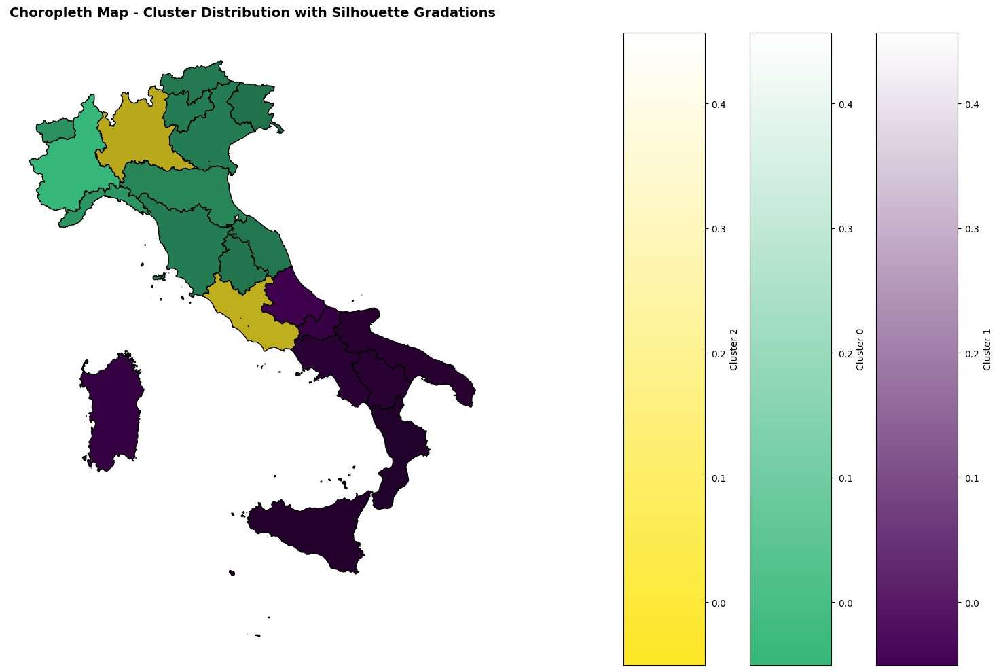

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, LinearSegmentedColormap
from matplotlib.cm import ScalarMappable
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Patch

# 1. Prepare cluster data
cluster_data = pd.DataFrame({
    'REGION NAME': RCI22_data_IT_W_FINAL['Region name'],
    'CLUSTER': RCI22_data_IT_W_FINAL['Cluster'],
    'Silhouette Index': RCI22_data_IT_W_FINAL['Silhouette Index']
})

# 2. Merge with GeoDataFrame
choropleth_italy_copy = choropleth_italy.merge(cluster_data, left_on='REGION NAME', right_on='REGION NAME')

# 3. Define colormap functions
def create_custom_colormap(color):
    return LinearSegmentedColormap.from_list(f'{color}_map', [color, 'white'], N=256)

# Custom colormaps based on assign_colors_RCI
cluster_colormaps = {cluster: create_custom_colormap(color) for cluster, color in assign_colors_RCI.items()}

# Normalize silhouette scores
silhouette_norm = Normalize(vmin=choropleth_italy_copy['Silhouette Index'].min(),
                           vmax=choropleth_italy_copy['Silhouette Index'].max())
silhouette_cmap = LinearSegmentedColormap.from_list('silhouette_cmap', ['white', 'grey'], N=256)

# Apply color function based on silhouette scores
def get_color(row):
    cluster_color = assign_colors_RCI.get(row['CLUSTER'], 'grey')
    silhouette_intensity = silhouette_cmap(silhouette_norm(row['Silhouette Index']))
    base_rgba = plt.cm.colors.to_rgba(cluster_color)
    return (
        silhouette_intensity[0] * base_rgba[0],
        silhouette_intensity[1] * base_rgba[1],
        silhouette_intensity[2] * base_rgba[2],
        base_rgba[3]  # Preserve the alpha channel of the base color
    )

choropleth_italy_copy['Color'] = choropleth_italy_copy.apply(get_color, axis=1)

# 4. Plot the map and colorbars
fig = plt.figure(figsize=(16, 10))
gs = GridSpec(1, len(assign_colors_RCI) + 1, width_ratios=[4] + [0.5] * len(assign_colors_RCI))  # Adjust grid size based on the number of clusters

# Map axis
ax_map = plt.subplot(gs[0])
choropleth_italy_copy.plot(ax=ax_map, color=choropleth_italy_copy['Color'], edgecolor='black', legend=False)
ax_map.set_title('Choropleth Map - Cluster Distribution with Silhouette Gradations', fontweight='bold', fontsize=14)
ax_map.axis('off')

# Function to create colorbars
def create_colorbar(cmap, norm, label, position):
    sm = ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar_ax = plt.subplot(gs[position])
    cb = fig.colorbar(sm, cax=cbar_ax, orientation='vertical')
    cb.set_label(label)
    return cb

# Create colorbars for each cluster
for i, (cluster, colormap) in enumerate(cluster_colormaps.items()):
    create_colorbar(colormap, silhouette_norm, f'Cluster {cluster}', i + 1)

plt.tight_layout()
plt.show()

Create a bar chart to display the **Silhouette values**, in order to make them more interpretable.

The regions should be ordered in descending order according to the `Score` value associated with the clusters.

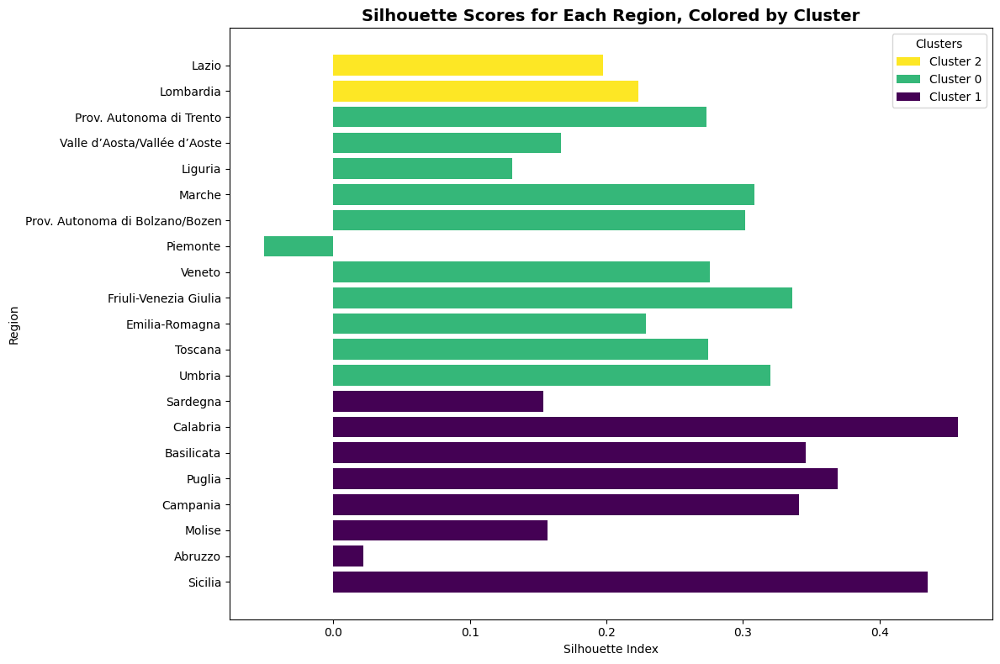

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# Define a color map for the clusters
color_map = assign_colors_RCI

# Add a color column to the DataFrame based on the cluster
RCI22_data_IT_W_FINAL_colored = RCI22_data_IT_W_FINAL.copy()
RCI22_data_IT_W_FINAL_colored['Color'] = RCI22_data_IT_W_FINAL['Cluster'].map(color_map)
RCI22_data_IT_W_FINAL_colored = RCI22_data_IT_W_FINAL_colored.merge(df_cluster_scores_RCI, on='Cluster', how='left')

# Sort the DataFrame by cluster for a cleaner plot
sorted_df = RCI22_data_IT_W_FINAL_colored.sort_values(by='Score')

# Create a horizontal bar plot of silhouette scores
plt.figure(figsize=(12, 8))
plt.barh(sorted_df['Region name'], sorted_df['Silhouette Index'], color=sorted_df['Color'])
plt.xlabel('Silhouette Index')  # Label for the x-axis
plt.ylabel('Region')            # Label for the y-axis
plt.title('Silhouette Scores for Each Region, Colored by Cluster', fontweight='bold', fontsize=14)  # Title of the plot

# Create custom legend
legend_elements = [Patch(facecolor=color, label=f'Cluster {cluster}') for cluster, color in color_map.items()]

# Add legend to the plot in the top right corner
plt.legend(handles=legend_elements, title='Clusters', loc='upper right', bbox_to_anchor=(1, 1))

plt.tight_layout()  # Adjust layout to fit labels and title
plt.show()  # Display the plot

### **Cluster Distribution**

To understand why the regions of *Piemonte* and *Abruzzo* appear to be incorrectly assigned from the Silhouette Scores Barplot, start by creating a `scatterplot matrix` for the most relevant indicators (those with the highest CV and therefore the most significant impact). All regions should be colored according to their cluster affiliation, with Piemonte highlighted in red and Abruzzo in light blue.

In [ ]:
columns_to_plot = list(cv_indicators.sort_values('CV', ascending = False).reset_index().drop(columns='index')[0:12]['Indicator'])

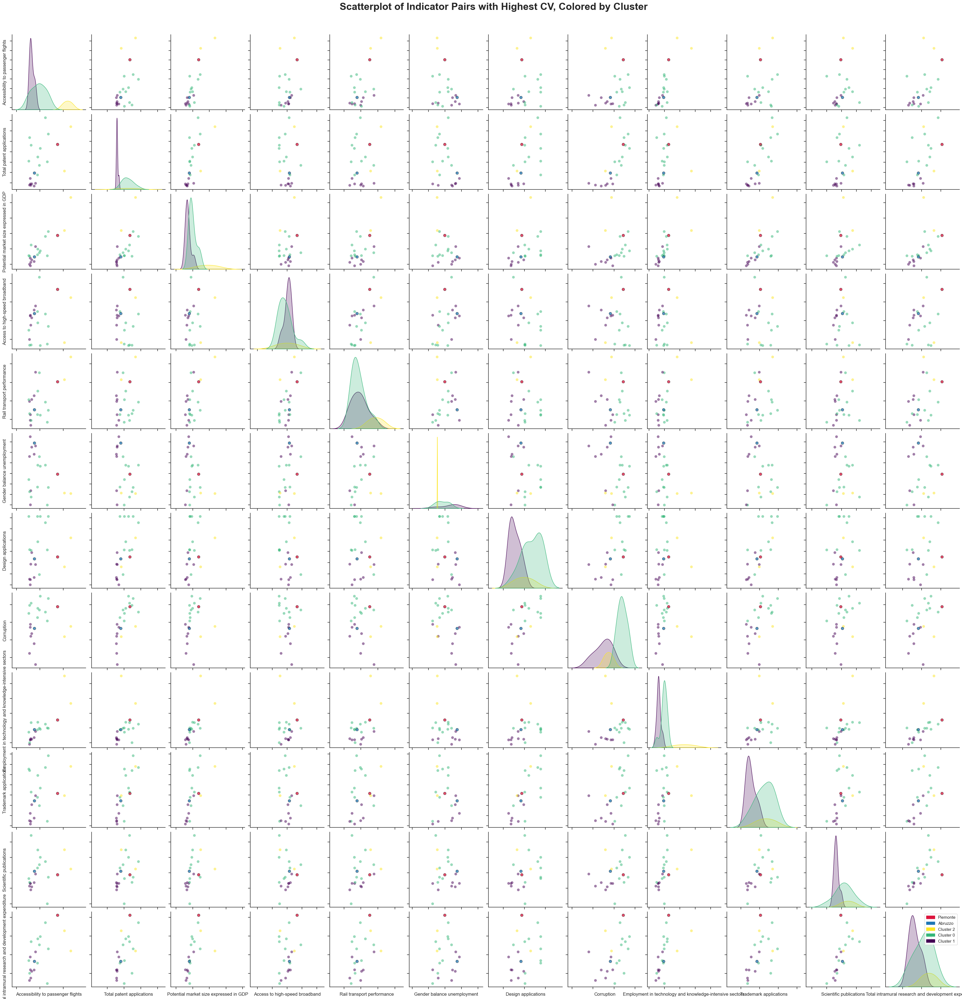

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import textwrap
from matplotlib.ticker import FixedLocator
import numpy as np

# Prepare the DataFrame with the necessary columns
data = RCI22_data_IT_W_FINAL[columns_to_plot + ['Region name', 'Cluster']].copy()

# Define colors for clusters
cluster_colors = assign_colors_RCI

# Add a color column, initially using the cluster colors
data.loc[:, 'Color'] = data['Cluster'].map(cluster_colors)

# Override colors for specific regions
data.loc[data['Region name'] == 'Piemonte', 'Color'] = '#DC143C'  # Red for Piemonte
data.loc[data['Region name'] == 'Abruzzo', 'Color'] = '#1f77b4'   # Blue for Abruzzo

# Add a border column
data.loc[:, 'Border'] = 'none'
data.loc[data['Region name'].isin(['Piemonte', 'Abruzzo']), 'Border'] = 'black'

# Set Seaborn style
sns.set(style="ticks")

# Convert color array to a list of unique colors
unique_colors = list(data['Color'].unique())

# Function to plot with borders for specific regions
def plot_with_borders(pairplot):
    for i, j in zip(*np.tril_indices_from(pairplot.axes, -1)):
        ax = pairplot.axes[i, j]
        for region in ['Piemonte', 'Abruzzo']:
            subset = data[data['Region name'] == region]
            ax.scatter(
                subset[columns_to_plot[j]], subset[columns_to_plot[i]],
                edgecolor=subset['Border'], linewidth=1, s=50,
                c=subset['Color'], alpha=0.5
            )

    for j, i in zip(*np.tril_indices_from(pairplot.axes, -1)):
        ax = pairplot.axes[i, j]
        for region in ['Piemonte', 'Abruzzo']:
            subset = data[data['Region name'] == region]
            ax.scatter(
                subset[columns_to_plot[j]], subset[columns_to_plot[i]],
                edgecolor=subset['Border'], linewidth=1, s=50,
                c=subset['Color'], alpha=0.5
            )

# Create the pairplot
pairplot = sns.pairplot(
    data,
    vars=columns_to_plot,  # Variables to plot
    hue='Color',           # Color based on the 'Color' column
    palette=unique_colors, # Use custom colors
    diag_kind="kde",       # Density plots on diagonals
    plot_kws={'alpha': 0.5, 's': 50, 'edgecolor': 'none', 'linewidth': 0.5},  # Scatter plot parameters
    height=3               # Height of each plot
)

# Apply borders to specific points
plot_with_borders(pairplot)

# Function to wrap long labels on axes
def wrap_labels(ax, width):
    # Wrap x-axis labels
    xticklabels = ax.get_xticks().tolist()
    ax.xaxis.set_major_locator(FixedLocator(xticklabels))
    ax.set_xticklabels([textwrap.fill(label.get_text(), width) for label in ax.get_xticklabels()], rotation=0)

    # Wrap y-axis labels
    yticklabels = ax.get_yticks().tolist()
    ax.yaxis.set_major_locator(FixedLocator(yticklabels))
    ax.set_yticklabels([textwrap.fill(label.get_text(), width) for label in ax.get_yticklabels()], rotation=0)

# Apply label wrapping to each axis
for ax in pairplot.axes.flatten():
    wrap_labels(ax, width=6)  # Adjust width as needed

# Remove the existing legend
if pairplot._legend:
    pairplot._legend.remove()

# Create a custom legend
handles = [
    patches.Patch(color='#DC143C', label='Piemonte'),
    patches.Patch(color='#1f77b4', label='Abruzzo')
] + [patches.Patch(color=color, label=f'Cluster {i}') for i, color in cluster_colors.items()]

plt.legend(handles=handles, loc='best')

# Add the title
plt.suptitle("Scatterplot of Indicator Pairs with Highest CV, Colored by Cluster", fontsize=26, fontweight='bold', y=1.02)

plt.show()

## **Pillar Analysis**

To further analyze the obtained results and seek additional explanations, proceed with the analysis of the clusters obtained by pillar. This involves representing Italy with regions colored according to their cluster affiliation, keeping in mind that the color assigned to each cluster depends on the customized `Score` calculated for each, with coloring according to the `viridis` scale.

In [ ]:
# Count the number of pillars in the dictionary
num_pillars = len(clustered_pillar_dfs)
print(f"Number of available Pillars: {num_pillars}")

# Display the names of the pillars
pillar_names = list(clustered_pillar_dfs.keys())
print("Pillar Names:")
for name in pillar_names:
    print(name)

Number of available Pillars: 9
Pillar Names:
Technological readiness – regional
Infrastructure
Health
Innovation
Institutions – regional
Market size
Higher education and lifelong learning
Business sophistication
Labour market efficiency


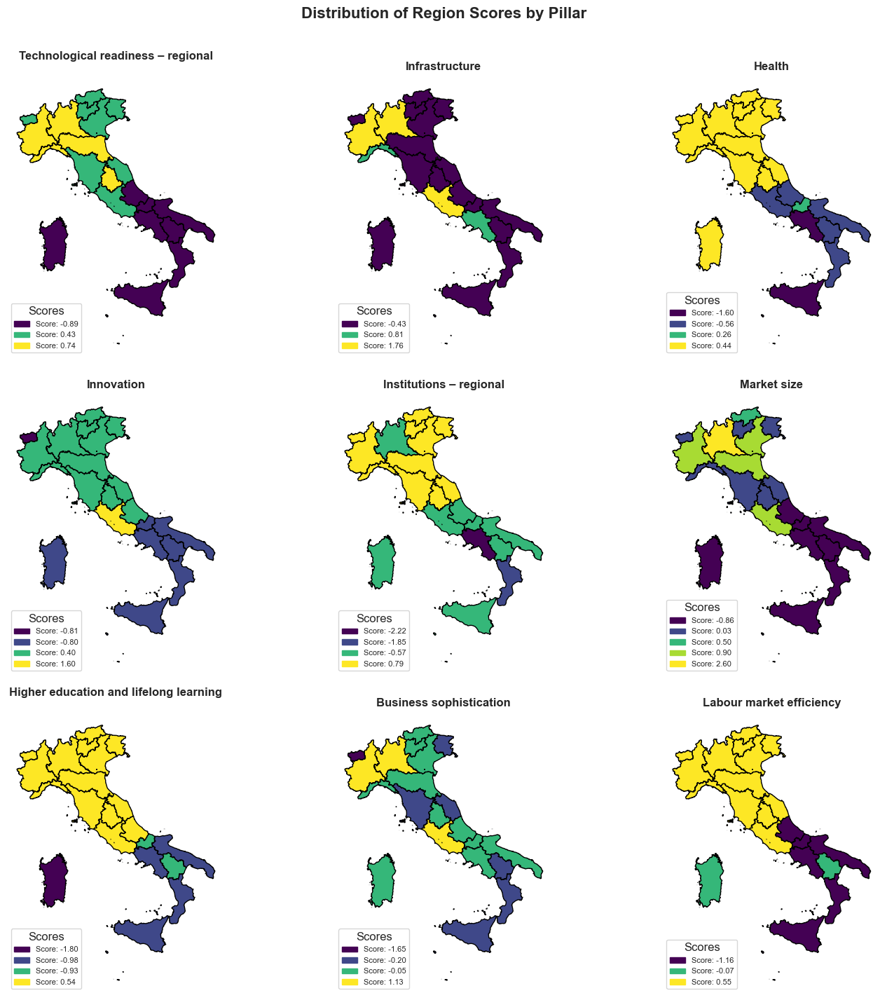

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# Dictionary to store cluster plots
plot_dfs = {}

# Loop through the pillar datasets with clusters and silhouette
for pillar, df_clustered in clustered_pillar_dfs.items():
    # Merge cluster data with the GeoDataFrame
    cluster_data = df_clustered[['NUTS', 'Region name', 'Cluster', 'Color', 'Score']]
    choropleth_italy_copy = choropleth_italy.merge(cluster_data, left_on='REGION NAME', right_on='Region name')

    # Create a subplot for the current pillar
    fig, ax = plt.subplots(1, 1, figsize=(8, 8))

    # Plot with custom colors
    choropleth_italy_copy.plot(color=choropleth_italy_copy['Color'], ax=ax, edgecolor='black')

    # Remove axes from the map
    ax.axis('off')

    # Set the title of the figure
    fig.suptitle(f'Choropleth Map - {pillar}', fontweight='bold', fontsize=12)

    # Save the plot in the dictionary
    plot_dfs[pillar] = fig

    # Close the figure to prevent it from being displayed individually
    plt.close(fig)

# Create a figure with a 3x3 grid
n_pillars = len(plot_dfs)
ncols = 3  # Number of columns in the grid
nrows = (n_pillars + ncols - 1) // ncols  # Number of rows in the grid

fig, axs = plt.subplots(nrows, ncols, figsize=(15, 5 * nrows))

# Convert axes to a flat array for easier access
axs = axs.flatten()

# Loop to display plots and add titles
for i, (pillar, fig) in enumerate(plot_dfs.items()):
    # Re-plot the figure in the grid rather than using imshow
    ax = axs[i]

    # Access the original data to re-plot
    cluster_data = clustered_pillar_dfs[pillar][['NUTS', 'Region name', 'Cluster', 'Color', 'Score']]
    choropleth_italy_copy = choropleth_italy.merge(cluster_data, left_on='REGION NAME', right_on='Region name')
    choropleth_italy_copy.plot(color=choropleth_italy_copy['Color'], ax=ax, edgecolor='black')

    # Add the pillar title
    ax.set_title(f'{pillar}', fontweight='bold', fontsize=12)

    # Get unique scores and colors for legend
    unique_scores = cluster_data[['Score', 'Color']].drop_duplicates()
    unique_scores = unique_scores.sort_values(by='Score')

    # Create legend handles for each score based on the data of the current plot
    legend_handles = [Patch(color=row['Color'], label=f'Score: {row["Score"]:.2f}') for _, row in unique_scores.iterrows()]

    # Add a custom legend for each subplot
    ax.legend(handles=legend_handles, loc='lower left', fontsize=8, title='Scores', frameon=True)

    # Remove axes
    ax.axis('off')

# Remove any excess axes (if there are more cells than pillars)
for j in range(i + 1, len(axs)):
    axs[j].axis('off')

# Adjust layout and main title
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Increase space for the main title
plt.suptitle('Distribution of Region Scores by Pillar', fontweight='bold', fontsize=16)

plt.show()

### **Choropleth Maps of Italy by Pillar**

To obtain a reference measure for evaluating the calculated `Score`, create a representation that colors the regions according to the `viridis` scale based on the score associated with each pillar.

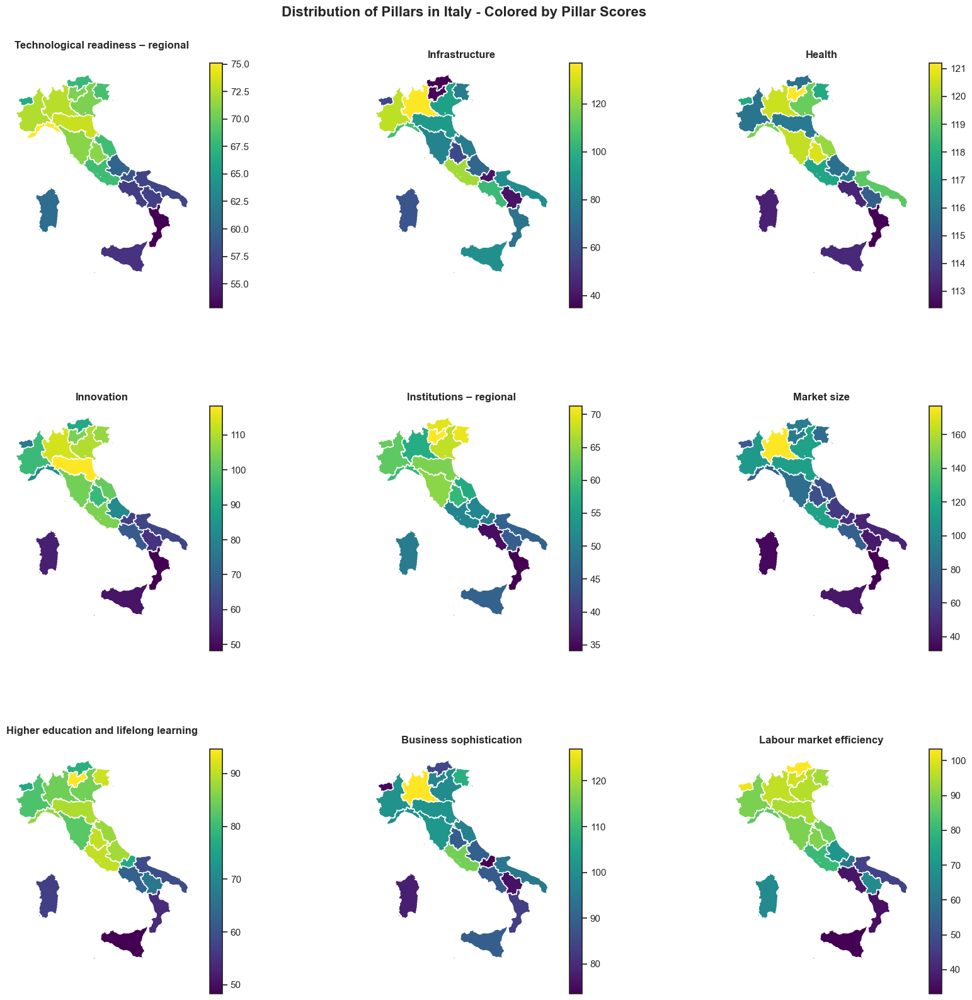

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Mapping dictionary between the desired pillar names and those in the dataset
pillar_mapping = {
    'Technological readiness – regional': 'Technological readiness Pillar',
    'Infrastructure': 'Infrastructure Pillar',
    'Health': 'Health Pillar',
    'Innovation': 'Innovation Pillar',
    'Institutions – regional': 'Institutions Pillar',
    'Market size': 'Market Size Pillar',
    'Higher education and lifelong learning': 'Higher education and LLL Pillar',
    'Business sophistication': 'Business sophistication Pillar',
    'Labour market efficiency': 'Labour Market  Efficiency Pillar'
}

# Columns we want to keep: 'NUTS', 'Region name', and the mapped pillars
pillar_columns = ['NUTS code', 'REGION NAME'] + list(pillar_mapping.values())

RCI22_data_IT_filtered = RCI22_IT[pillar_columns]

# Merge the geographic dataset with the 'Pillar' data on the 'NUTS code' column
choropleth_italy_cleaned = choropleth_italy.merge(RCI22_data_IT_filtered, left_on='REGION NAME', right_on='REGION NAME')

# Create a figure with a 3x3 grid
fig, axes = plt.subplots(3, 3, figsize=(20, 18))  # 3x3 grid with larger dimensions for better visibility
fig.subplots_adjust(hspace=0.4, wspace=0.4, top=0.93)  # Add space between plots and the main title

# Convert axes into a flat array for easier access to each subplot
axes = axes.flatten()

# Loop through the pillars and generate each map in a subplot of the grid
for i, (pillar, column) in enumerate(pillar_mapping.items()):
    if column in choropleth_italy_cleaned.columns:
        # Create the choropleth map in the corresponding subplot
        ax = axes[i]
        choroplet_map = choropleth_italy_cleaned.plot(column=column, cmap='viridis', legend=True, ax=ax)

        # Access the colorbar and set its label
        colorbar = choroplet_map.get_figure().axes[1]  # Get the colorbar axis
        colorbar.set_xlabel('Pillar Value', fontsize=10)  # Set the colorbar title

        # Remove the axes from the map
        ax.axis('off')

        # Set the title for each subplot
        ax.set_title(f'{pillar}', fontweight='bold', fontsize=12)
    else:
        print(f"Column '{column}' not found in the dataset.")

# Show the grid with all the plots
plt.suptitle('Distribution of Pillars in Italy - Colored by Pillar Scores', fontweight='bold', fontsize=16, y=0.98)  # Set the position of the main title
plt.show()

**Conclusions**

The analysis confirms that Italy's regional competitiveness is significantly influenced by territorial disparities, highlighting a persistent **North-South divide**. Key factors contributing to these disparities include:

- **Technological readiness**
- **Infrastructure quality**
- **Healthcare**
- **Education**
- **Labor market efficiency**
- **Institutional strength**

Northern and Central regions, such as **Lombardia**, **Emilia-Romagna**, and **Veneto**, generally outperform Southern regions like **Calabria** and **Sicilia** in these areas.

The analysis refined the initial **68 indicators** to **31** that effectively profile Italian regions, including factors related to:

- **Institutions**
- **Infrastructure**
- **Health**
- **Education**
- **Labor market efficiency**
- **Market size**
- **Technological readiness**
- **Business sophistication**
- **Innovation**

While the **RCI** provides a broad overview of regional competitiveness, it lacks detailed insight into specific regional challenges. A more nuanced, region-specific analysis is necessary for targeted policy interventions. Addressing regional disparities requires a comprehensive approach that both enhances competitiveness in underperforming areas and supports growth in already strong regions.
